#### Student Name: Elad Prager
#### Student ID: 200865780

# Overview
### Due Jan 7th

Please fill out this form to give feedback about another student's work on homework 2: https://forms.gle/4mGB8FpikN9nTKvz6 

If you did not complete homework 2, please only fill out the last question on the form.

##Instructions: 

This notebook is an interactive assignment; please read and follow the instructions in each cell.

Assignments are to be turned in individually, you can collaborate with one classmate but EACH must turn in a copy of the homework.

Cells that require your input (in the form of code or written response) will have 'Question #' above.

After completing the assignment, please submit this notebook. Please leave the audio loaded when submitting the homework.

Upload your completed assignment on moodle.

In [ ]:
# If you're collaboraing with a classmate, please fill in the following:

collaboration = {
    "200865780" : "201050135"
}

You may need to run the following commands to set up your environment:

`pip install tensorflow`

`pip install keras`

`pip install --upgrade protobuf`

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.io import wavfile
from numpy.linalg import svd
from scipy.stats.mstats import gmean
from matplotlib import rcParams
import scipy
import os
import sys
import glob
import pickle
from music21 import converter, instrument, note, chord, stream
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM, Activation, Lambda
from keras.layers import BatchNormalization as BatchNorm
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint
import tensorflow.compat.v1 as tf
tf.disable_eager_execution()
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


# PCA with a Linear Autoencoder


In this problem, we will practice using basic neural network procedures by running an autoencoder network.
This network is implemented in TensorFlow (essentially Keras with an expanded toolset); the functions we call are nearly identical to those you will see in Keras. 

Let's create a sin+noise signal to use as input to our network:

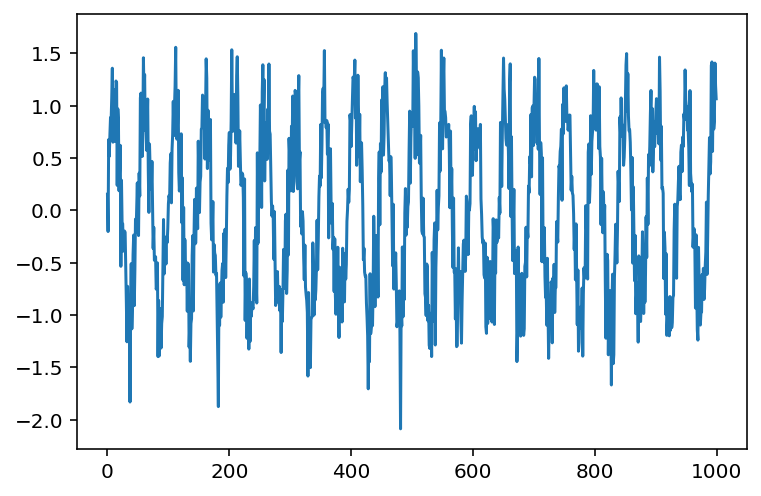

In [ ]:
f0 = 203
fs = 10000
T = 3
Ns = fs*T

def buffer(input_data, sample_rate, window_size, hop_size):
    output = np.array([input_data[i:i+window_size] for i in range(0, len(input_data)-window_size, hop_size)])
    return output.T

s = np.sin(2*np.pi*f0*np.arange(Ns)/fs)

n = np.random.randn(Ns)

x = s + 0.3*n 

plt.plot(x[:1000])
wavfile.write('out2.wav', fs, x)
xmat = buffer(x,fs,400,200)

Here we create an AE with 2 hidden layers. 

This neural network is implemented in TensorFlow. 

Please review the code cells below, and answer the questions that follow. 

In [ ]:
n_inputs = np.shape(xmat)[0]
n_hidden = 2 

learning_rate = 0.01 

X = tf.compat.v1.placeholder(tf.float32, shape=[None, n_inputs])
W = tf.Variable(tf.truncated_normal(stddev=.1, shape =[n_inputs,n_hidden]))

hidden = tf.matmul(X,W)
outputs = tf.matmul(hidden,tf.transpose(W))

reconstruction_loss = tf.reduce_mean(tf.square(outputs - X))

optimizer = tf.train.AdamOptimizer(learning_rate)
training_op = optimizer.minimize(reconstruction_loss)

init = tf.global_variables_initializer()

In [ ]:
print(W.shape)

(400, 2)


In [ ]:
print(tf.transpose(W).shape)

(2, 400)


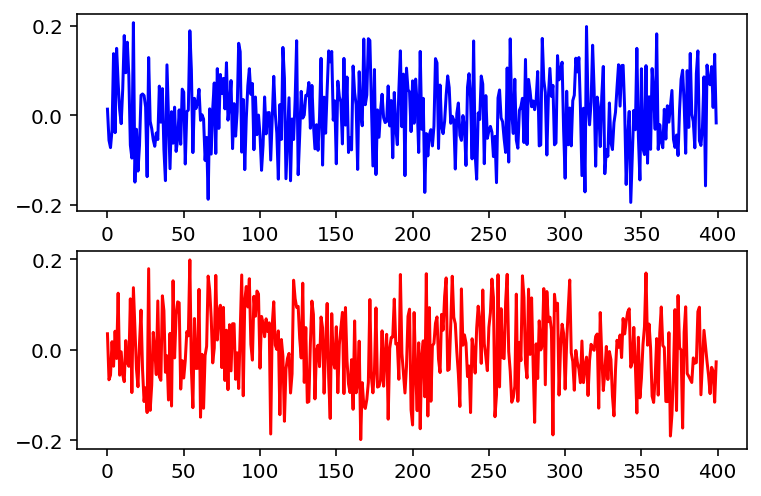

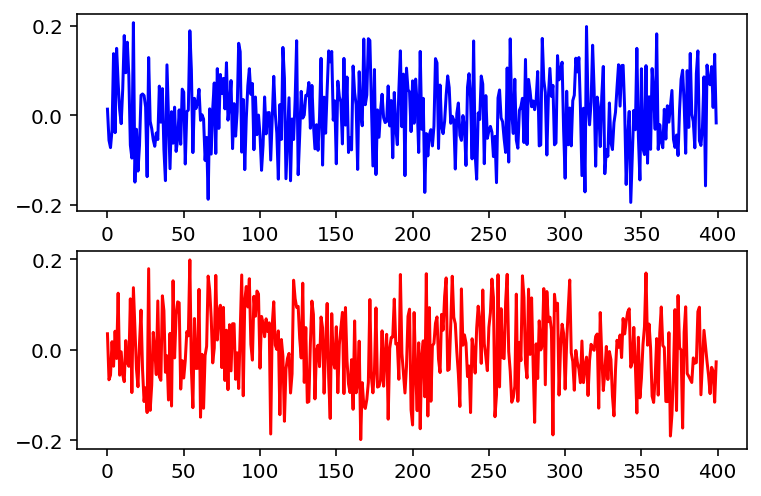

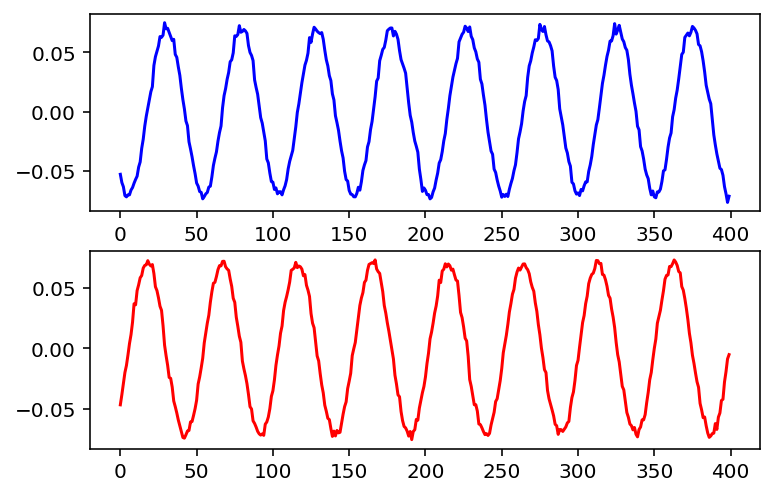

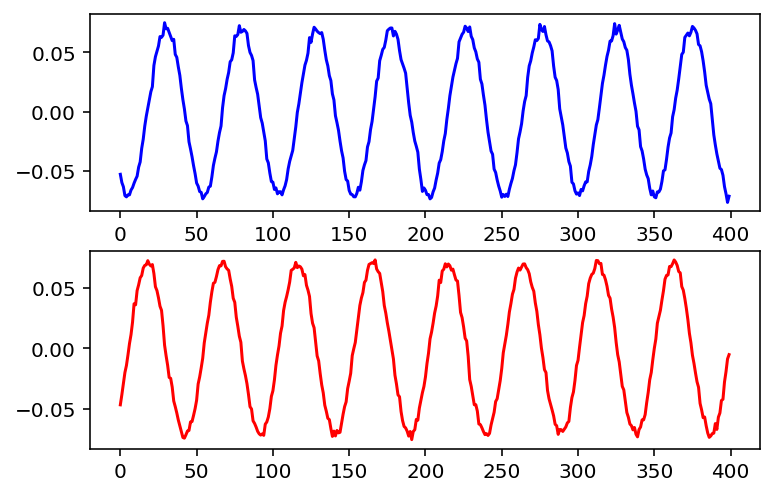

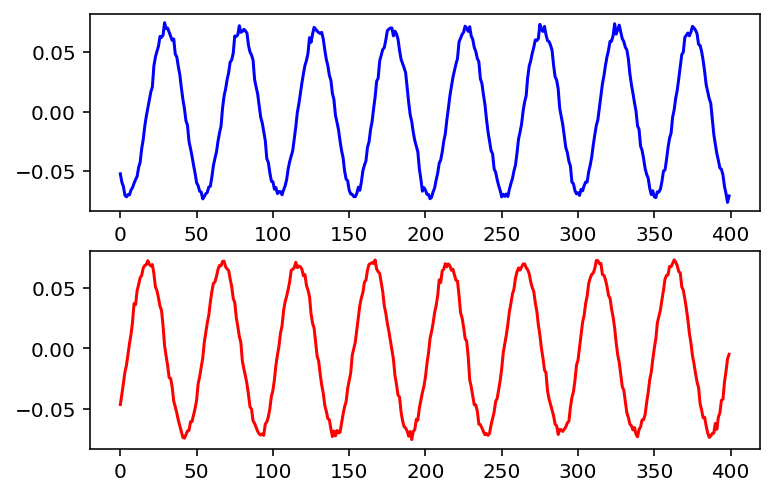

...

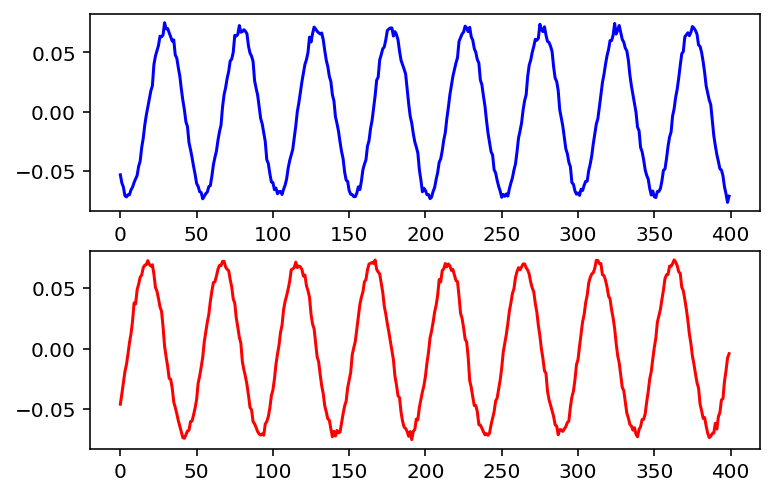

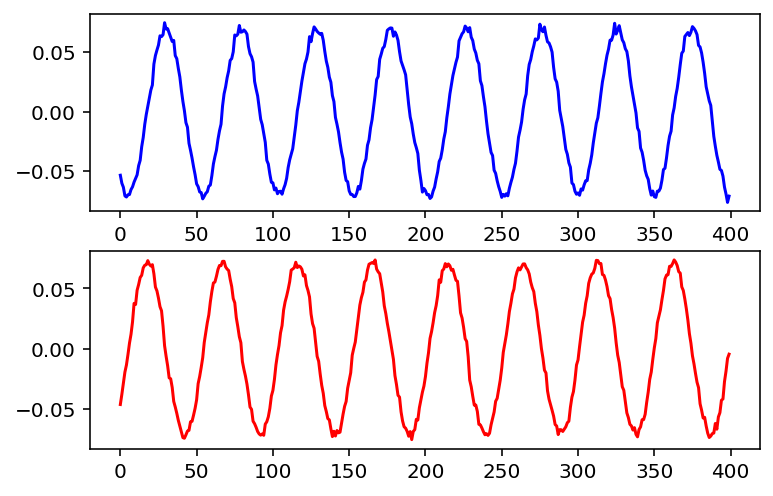

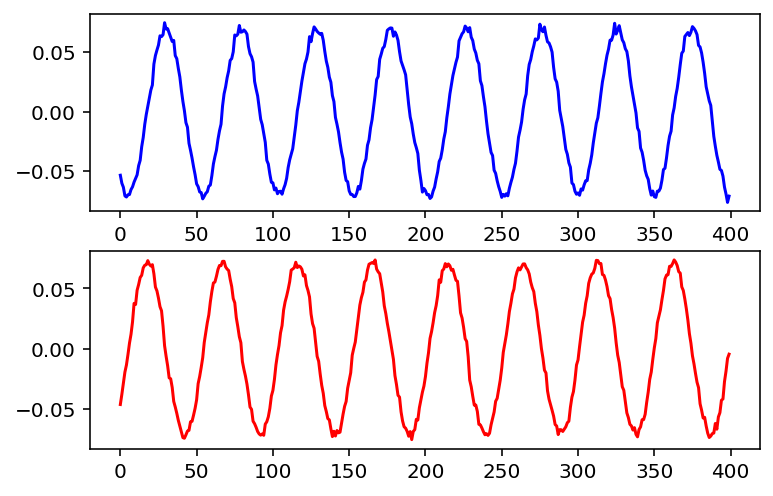

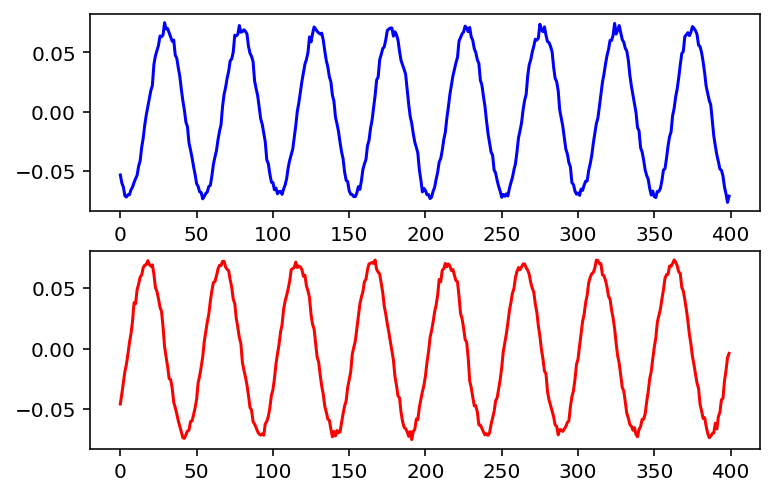

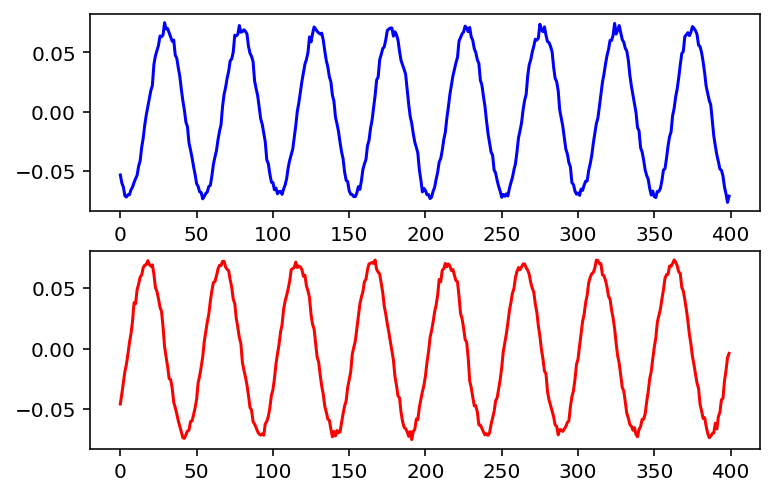

Done with training


In [ ]:
n_iterations = 10000
codings = hidden
X_train = xmat.T
X_test = X_train

col = ['b','r','g','c','m','y','k']

sess = tf.InteractiveSession()
init.run()
    
for iteration in range(n_iterations):
    training_op.run(feed_dict={X: X_train})

    if iteration %1000 == 0:
        W_val = W.eval()
        plt.clf()
        for k in range(n_hidden):
            plt.subplot(n_hidden,1,k+1)
            plt.plot(W_val[:,k],col[k % len(col)])
        plt.show(False)
        plt.pause(0.001)

codings_val = codings.eval(feed_dict={X: X_test})

print("Done with training")

In [ ]:
print(n_inputs)

400


In [ ]:
print(X_train.shape)

(148, 400)


In [ ]:
ae_reconstruction = outputs.eval(feed_dict={hidden: codings_val})

##### Question 1 (10 points)

What is an autoencoder? Please explain briefly. What would happen (ideally) if you pass a portion of signal x through the trained network?

**An autoencoder is a type of neural network which consists of two parts: an encoder and a decoder. Autoencoders allow to reduce dimensionality and denosing, through the process of compressing input data, encoding it, and then reconstructing it as an output.<br><br> In the context of audio processing, when a portion of signal x is passed through a trained autoencoder network, the encoder maps the input signal to a lower-dimensional representation in the latent space. Then the decoder reconstructs the original signal as closely as possible,  by adjusting the weights of the network such that the reconstruction error between the original signal and the reconstructed signal is minimized.**

##### Question 2 (5 points)

Based on the observed shape of n_inputs and the definition of X_train, what exactly is being passed to the input layer of the network for a single forward pass? Be specific!

**During a single forward pass, a batch of 148 instances is input to the network. Each instance is a 400-dimensional vector representing an overlapping window of the original sinusoidal signal with added noise. The batch of instances is organized as a 148x400 matrix. When this batch is input to the input layer of the network, the autoencoder processes each window, encoding it into a 2-dimensional vector and then decoding it back into a 400-dimensional vector, which represents the reconstructed window.**

##### Question 3 (5 points)

What variable(s) are used to represent the network weights? How are these weights initialized prior to training?

**W in the shape of (400x2) is used to represent the network weights. Speically, in the encoding part we're using W as is, and in the decoding part we're using W transposed (2x400). These where initlized prior to training with a truncated normal distribution with a standard deviation of 0.1. <br><br>In particular, Truncated normal distribution is a continuous probability distribution derived from the normal Gaussian distribution by truncating (cutting off) the range of values at a specified threshold, resulting in a distribution with a range of allowed values and zero probability for values outside this range <br><br> Initializing the weights is an important step in the training process because it determines the starting point from which the optimization algorithm will search for the optimal weights. Initializing the weights properly can affect the speed and quality of the training process, as well as the generalization performance of the trained model.**

##### Question  4 (5 points)

What is being minimized in the reconstruction loss? Why is this helpful?

**We're minimizing the mean squared error (MSE) of the difference between the original audio signal and the reconstructed signal produced by the autoencoder. MSE is oftenly used as a loss function in machine learning because it penalizes large errors more heavily than small errors and it is relatively easy to compute and differentiate.<br><br> Minimizing the reconstruction loss is helpful because it allows the autoencoder to accurately reconstruct the original audio signal. This is important because it allows the autoencoder to extract relevant features from the signal and preserve the most important information.**

##### Question 5 (5 points)

What is an optimizer? What are 3 common optimizers? Which optimizer is used in this AE training? 

**An optimizer is an algorithm that is used to adjust the parameters of a model in order to minimize a loss function. Optimizers are a key component of the training process for machine learning models, as they determine how the model's parameters are updated based on the data.<br><br>There are many different optimizers available, and the choice of optimizer can have a significant impact on the performance of the model. Some common optimizers include:<br><br>**
> **1. Stochastic gradient descent (SGD): SGD is a simple and efficient optimizer that uses the gradient of the loss function with respect to the model parameters to update the parameters. It is widely used for training deep learning models, but can be sensitive to the choice of learning rate.<br><br>2. Momentum: Momentum is an optimizer that uses the gradient of the loss function with respect to the model parameters, as well as a moving average of the gradients from previous iterations, to update the parameters. This can help the optimization process converge faster and be more stable.<br><br>3. Adam: Adam (Adaptive Moment Estimation) is a popular optimizer that combines the ideas of SGD and momentum to provide a fast and efficient optimization algorithm. It uses an adaptive learning rate that adjusts the step size based on the current gradient and the historical gradient, which can help the optimization process converge more quickly and be more stable.<br><br>**

**In our case, we're using an Adam optimized, which is often used as a default optimizer for many machine learning tasks because it can work well on a wide range of problems and is relatively easy to configure. It has several hyperparameters that can be adjusted to fine-tune its performance, such as the learning rate and the decay rates for the moving averages of the gradients. In general, Adam works well in practice and can often outperform other optimizers, especially when the data is noisy or exhibits strong nonlinearities.**

We can examine now the "codings", i.e. the hidden unit values and their distribution. The more signigicant codings should have smaller variances.

mean:  [ 0.02678492 -0.2557566 ]
variance [10.129108  9.865177]


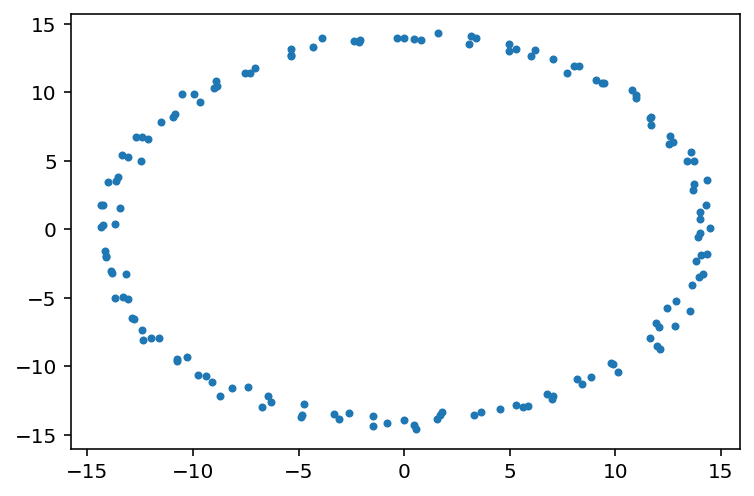

In [ ]:
plt.plot(codings_val[:,0],codings_val[:,1],'.')
print ("mean: ", np.mean(codings_val,0))
print ("variance", np.std(codings_val,0))

###### Question 6 (5 points)

In what way does the autoencoder network function similarly to PCA?

**Autoencoder networks and principal component analysis (PCA) are both techniques that can be used for dimensionality reduction and feature extraction. In this sense, they function similarly in that they both aim to represent data using a lower-dimensional space while preserving as much of the original information as possible.<br><br>However, there are some key differences between the two approaches. One of the main differences is that autoencoder networks are neural networks, while PCA is a linear dimensionality reduction technique. This means that autoencoder networks can learn nonlinear relationships between the input and output data, while PCA is limited to linear relationships. <br><br>Another difference is that autoencoder networks are trained using an unsupervised learning approach, where the goal is to minimize the reconstruction error between the input and output data. In contrast, PCA is an unsupervised technique that does not require training, but rather relies on an eigenvalue decomposition of the data covariance matrix to identify the principal components.**

##### Question 7 - PCA versus AE (15 points)

Using sklearn.decomposition.PCA (or another PCA implementation in Python), illustrate the ideas you discuss in Question 1 & Question 7. You should have two plots: one showing the output of the AE network on a single sample, and another showing the output of your PCA on the same sample. How many principal components do you use in your reconstruction to achieve similar performance to the AE network? 


In [ ]:
from sklearn.decomposition import PCA

def pca_ae_plots(n_components):
  # Initialize the PCA model
  pca_model = PCA(n_components=n_components)

  # Fit the PCA model to the training data
  pca_model.fit(X_train)

  # Transform the test data using the PCA model
  X_test_pca = pca_model.transform(X_test)

  # Inverse transform the PCA-transformed data to obtain the reconstructed data
  pca_reconstructed = pca_model.inverse_transform(X_test_pca)

  print(f'explained variance per component: {pca_model.explained_variance_ratio_}')
  print(f'\nplot for PCA with {n_components} components\n')

  # Plot the original and reconstructed data
  fig, ax = plt.subplots()
  ax.plot(X_test[0][:100], color='g', linewidth=1, label="Original")
  ax.plot(ae_reconstruction[0][:100], color='r', linewidth=1, label="AE")
  ax.legend()
  ax.set_title("AE compared to Sample")
  plt.show()

  fig, ax = plt.subplots()
  ax.plot(X_test[0][:100], color='g', linewidth=1, label="Original")
  ax.plot(pca_reconstructed[0][:100], color='b', linewidth=1, label="PCA")
  ax.legend()
  ax.set_title("PCA compared to Sample")
  plt.show()

  fig, ax = plt.subplots()
  ax.plot(pca_reconstructed[0][:100], color='b', linewidth=1, label="PCA")
  ax.plot(ae_reconstruction[0][:100], color='r', linewidth=1, label="AE")
  ax.legend()
  ax.set_title("PCA compared to AE")
  plt.show()

explained variance per component: [0.43989386]

plot for PCA with 1 components



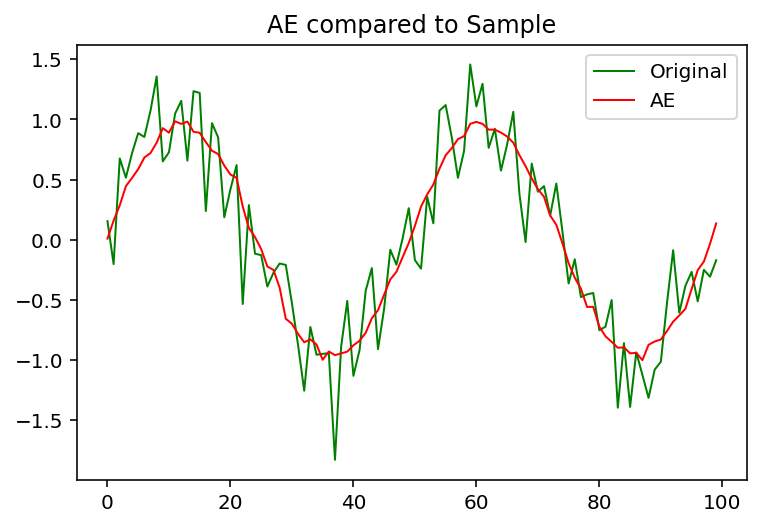

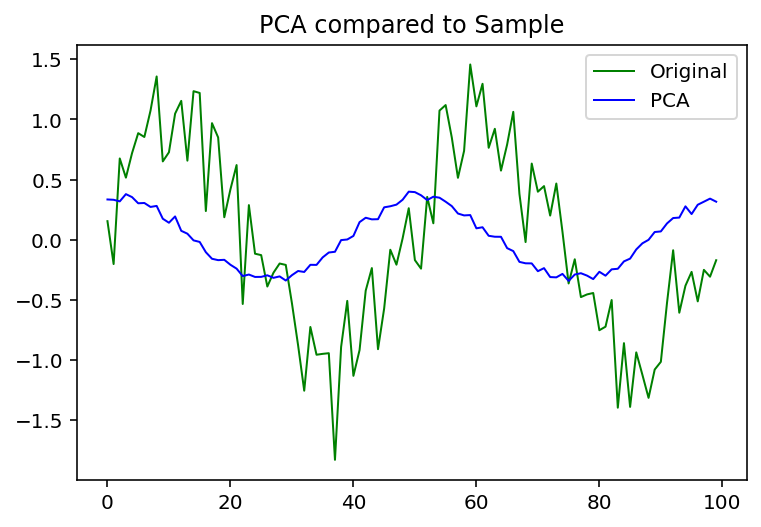

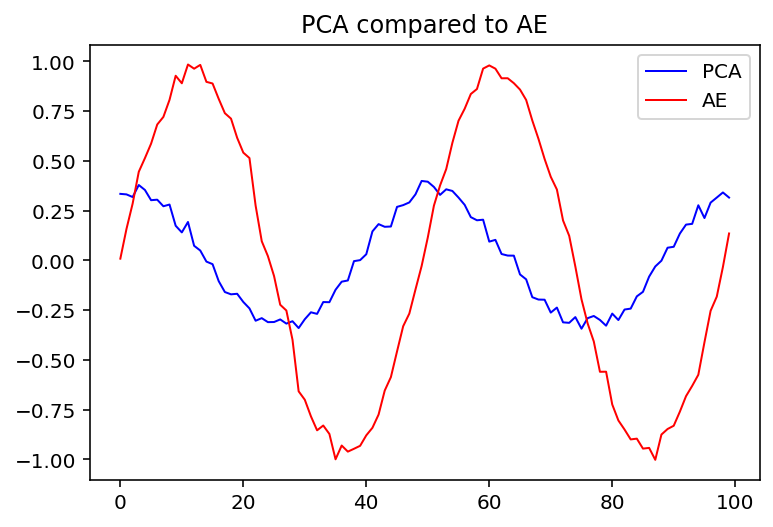

In [ ]:
pca_ae_plots(1)

explained variance per component: [0.43989386 0.41031375]

plot for PCA with 2 components



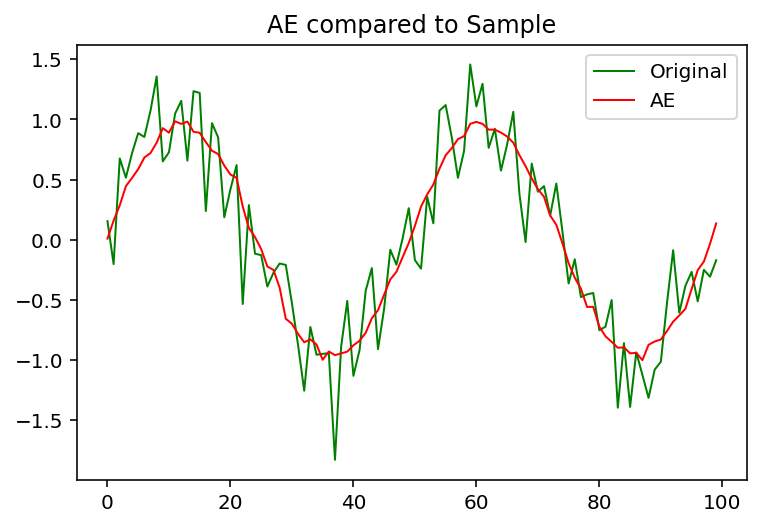

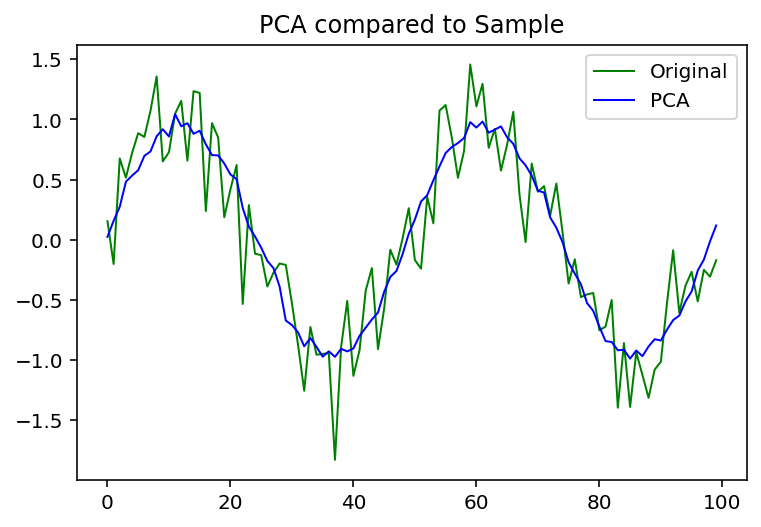

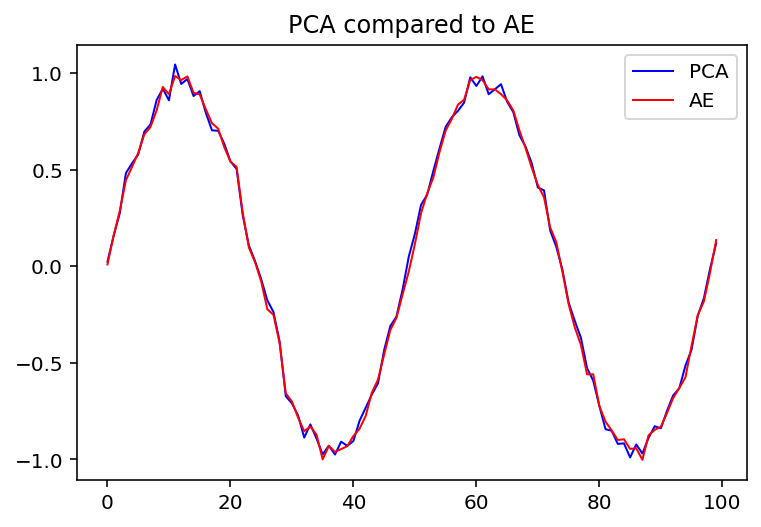

In [ ]:
pca_ae_plots(2)

explained variance per component: [0.43989386 0.41031375 0.00259727]

plot for PCA with 3 components



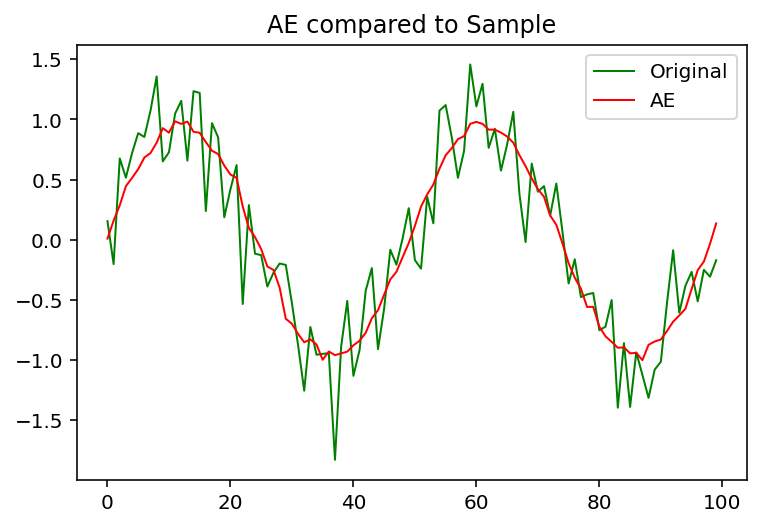

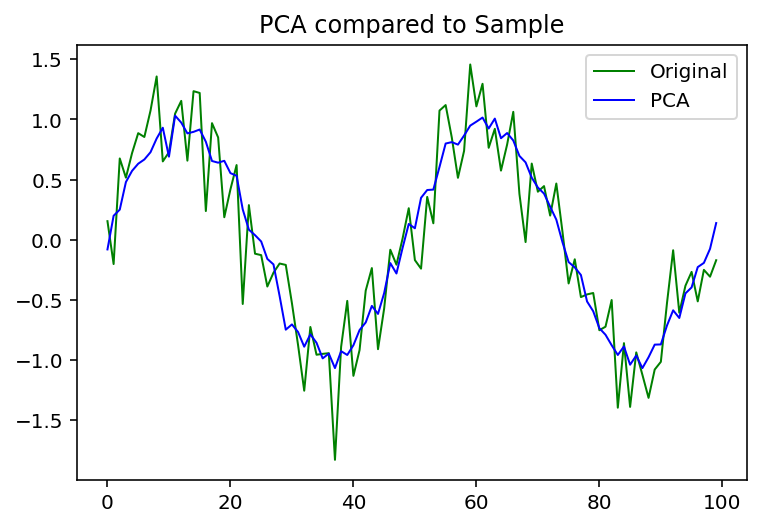

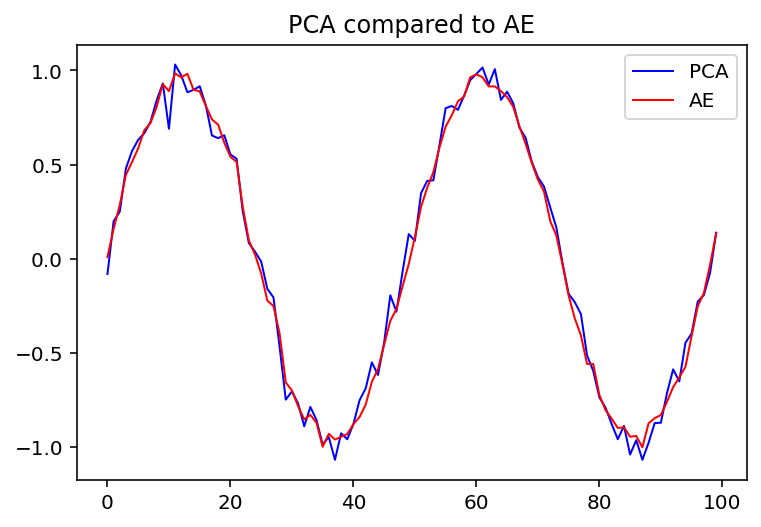

In [ ]:
pca_ae_plots(3)

**Three experiments were conducted to compare the performance of a PCA and an AE network. In the first experiment, a PCA with only one principal component was used, which explained 43.9% of the total variance in the dataset but had inferior performance to the AE network. In the second experiment, a PCA with two principal components was used, which explained 43.9% and 41% of the total variance in the dataset and had similar performance to the AE network. Finally, in the third experiment, a PCA with three principal components was used, with the last component explaining only 0.2% of the total variance in the dataset. This demonstrated that two components were sufficient for achieving similar performance to the AE network.<br><br>In conclusion, using two principal components in the PCA resulted in similar performance to the AE network.**

# Parallel CNN - RNN Model


In this problem, we will explore the use of CNN-RNN for genre classification.

The main tasks are:

specifying the parameters of the CNN model
you are provided with the code of the RNN model
conducting an experiment with CNN-RNN model
visualizing the preformance of the CNN layers
performing ablation study by comparing it to only CNN and only RNN model

In [ ]:
pip install keract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import os
from os.path import isfile
import keras
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Bidirectional, LSTM, Dropout, Activation, GRU
from keras.layers import Conv2D, concatenate, MaxPooling2D, Flatten, Embedding, Lambda


from keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from keras import backend as K
from keras.utils import np_utils
from tensorflow.keras.optimizers import RMSprop

from keras import regularizers


import librosa
import librosa.display
import matplotlib.pyplot as plt
%matplotlib inline

import keract

### Define representation of genres

Each genre is assigned a number, since the neural network will output a number [not a word]. 

In [ ]:
dict_genres = {'Electronic': 0, 'Experimental': 1, 'Folk': 2, 'Hip-Hop': 3, 
               'Instrumental': 4,'International': 5, 'Pop': 6, 'Rock': 7}


reverse_map = {v: k for k, v in dict_genres.items()}
print(reverse_map)

{0: 'Electronic', 1: 'Experimental', 2: 'Folk', 3: 'Hip-Hop', 4: 'Instrumental', 5: 'International', 6: 'Pop', 7: 'Rock'}


### Load the dataset 

The dataset can be found at https://drive.google.com/drive/folders/1bAlEwSeCjE8nX0TiYuOMq8W3cYOY688w?usp=sharing

Instructions: you can manually download it to your computer, or use wget from a command line. \
If you are using colab, you can copy the files to your drive and then mount the drive using google colab drive command: \


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
npzfile = np.load('/content/drive/MyDrive/audio_processing/shuffled_train.npz')

X_train = npzfile['arr_0']   # Audio samples
y_train = npzfile['arr_1']   # Genre labels
print(X_train.shape, y_train.shape)

(6394, 640, 128) (6394, 8)


In [ ]:
npzfile = np.load('/content/drive/MyDrive/audio_processing/shuffled_valid.npz')

X_valid = npzfile['arr_0']
y_valid = npzfile['arr_1']
print(X_valid.shape, y_valid.shape)

(800, 640, 128) (800, 8)


### Let's see what one data sample looks like:

Electronic


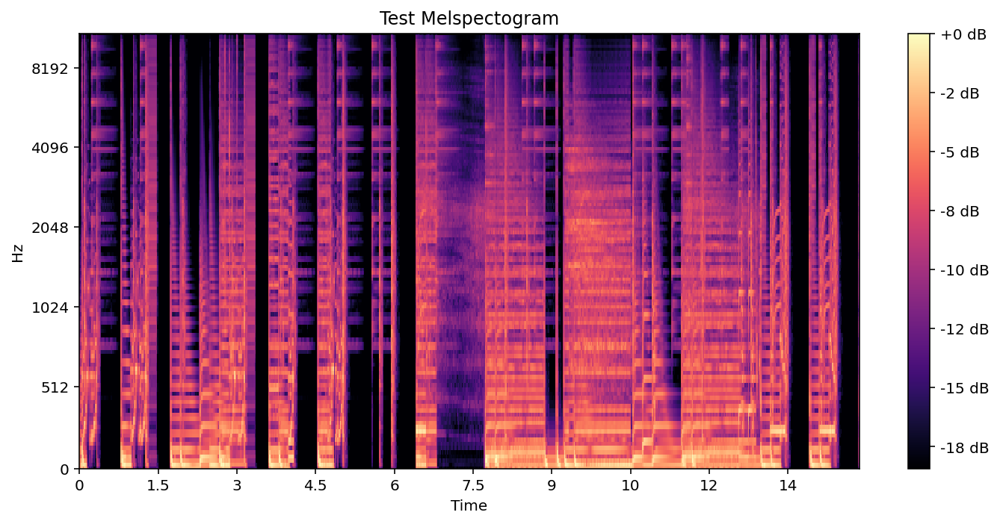

In [ ]:
one_arbitrary_sample = 0
spectogram = X_train[one_arbitrary_sample]
genre = np.argmax(y_train[one_arbitrary_sample])
print(reverse_map[genre])     # Reverse Map: Number to Label

plt.figure(figsize=(10, 5))
librosa.display.specshow(spectogram.T, y_axis='mel', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Test Melspectogram')
plt.tight_layout()

##### Question 8 (10 points)

Create a few mel-spectograms samples for each genre. What are some visual differences between the genres? Are there similarities? What are some unique features for each genre that we might be able to use for classification?

In [ ]:
def plot_spectogram_genre(genre):
  num_plot = 0
  print('########################'+genre+'########################\n')
  for i, x in enumerate(X_train):
    if reverse_map[np.argmax(y_train[i])] == genre:
      spectogram = X_train[i]

      plt.figure(figsize=(10, 5))
      librosa.display.specshow(spectogram.T, y_axis='mel', x_axis='time')
      plt.colorbar(format='%+2.0f dB')
      plt.title(f'{genre} Melspectogram {num_plot+1}')
      plt.tight_layout()
      plt.show()

      num_plot += 1
    if num_plot == 5:
      break

########################Electronic########################



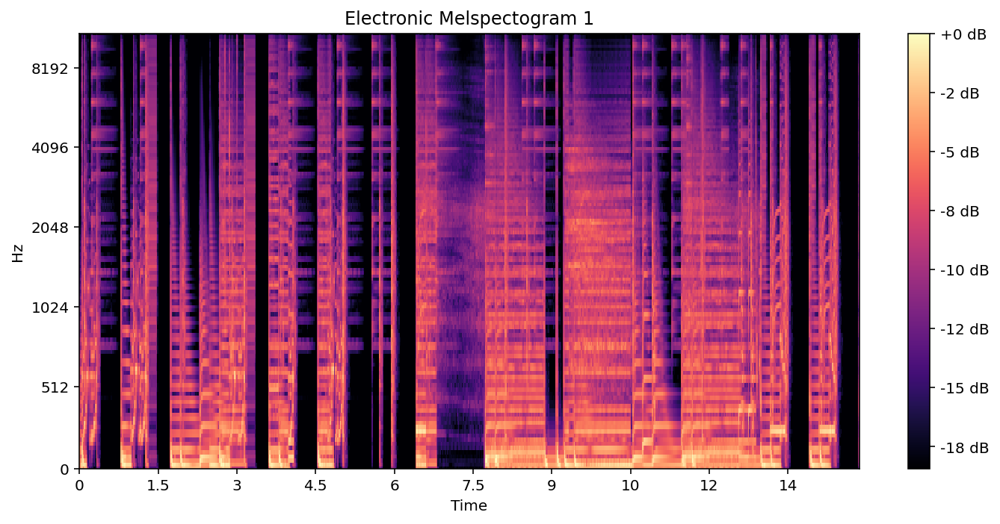

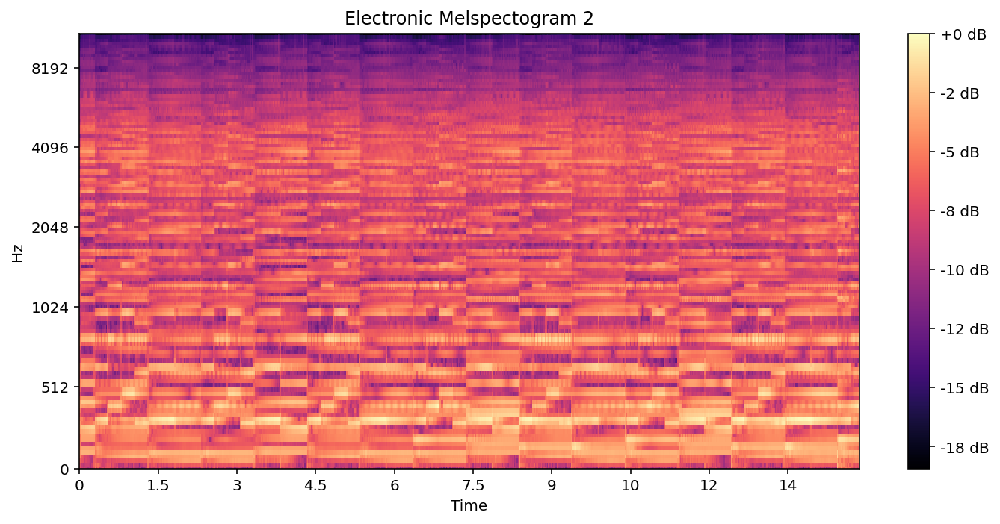

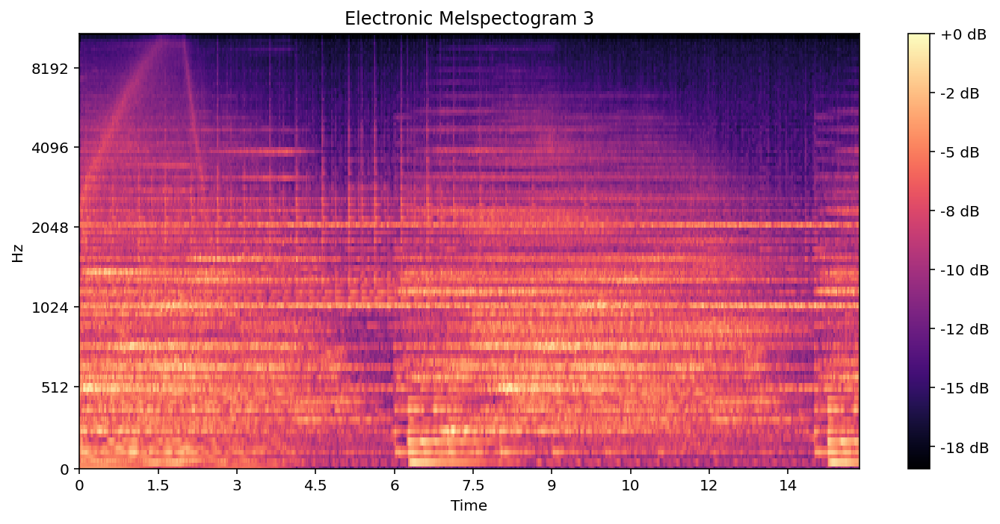

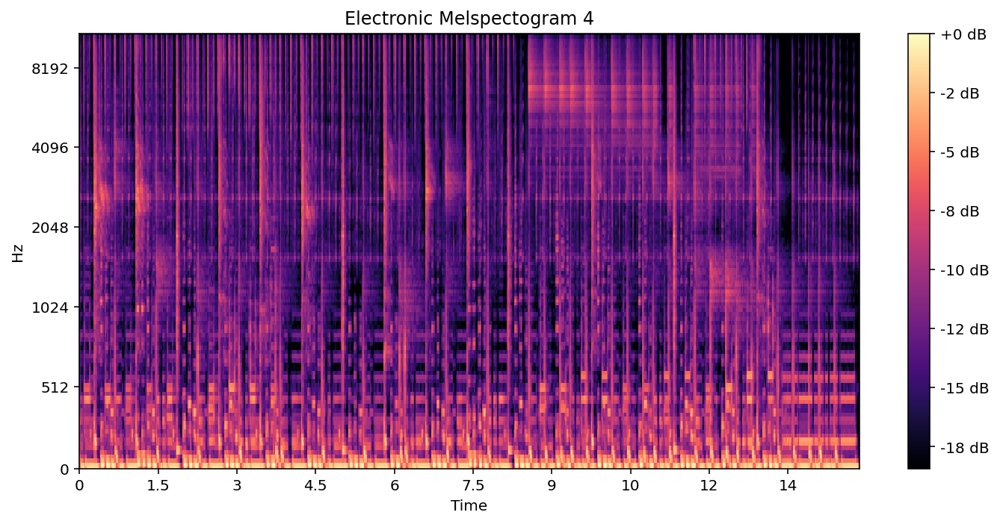

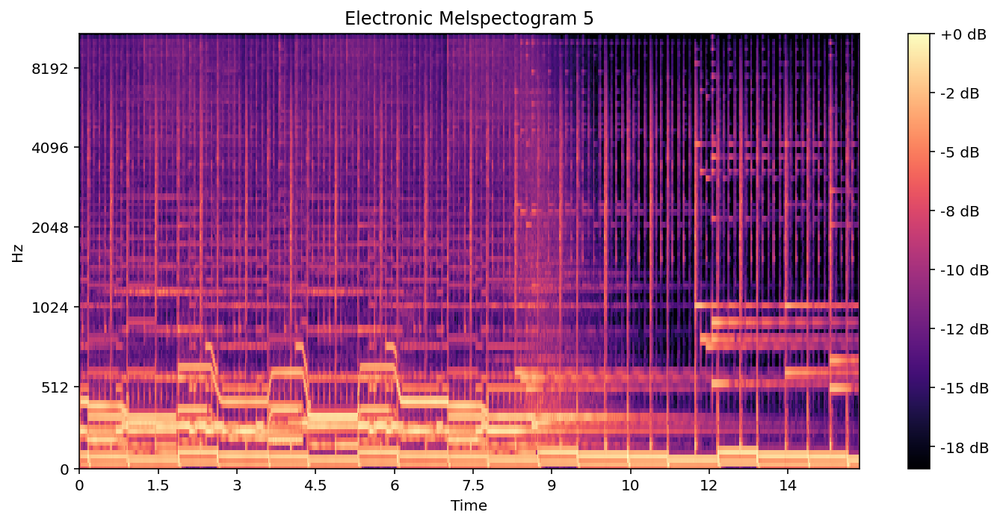





########################Experimental########################



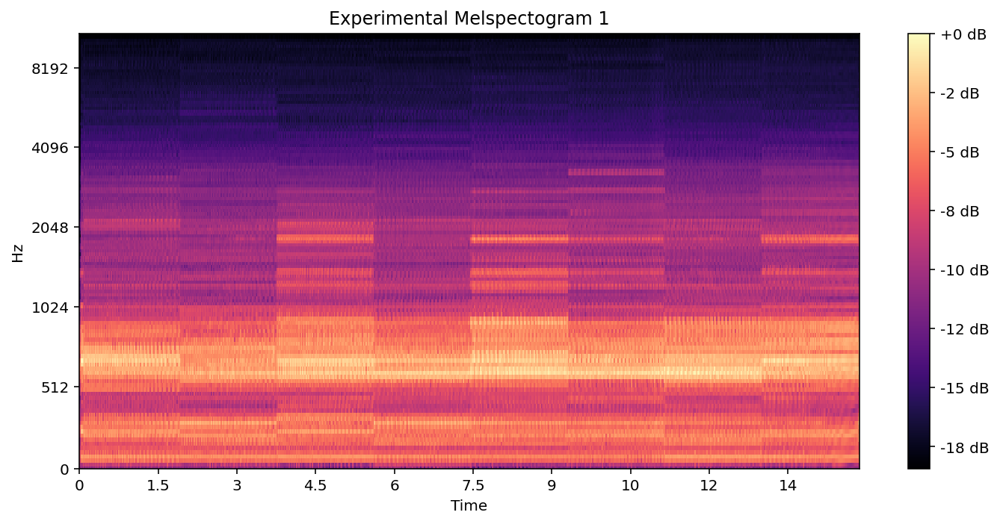

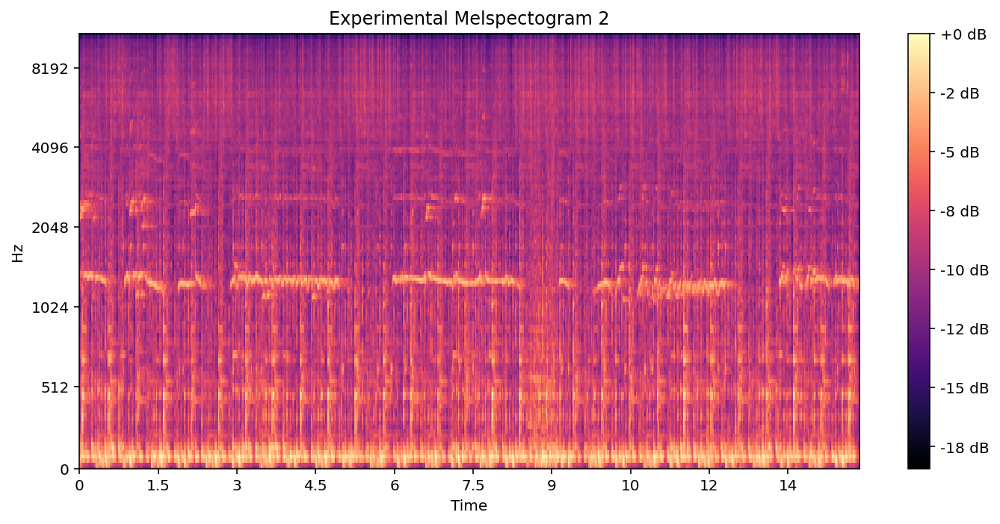

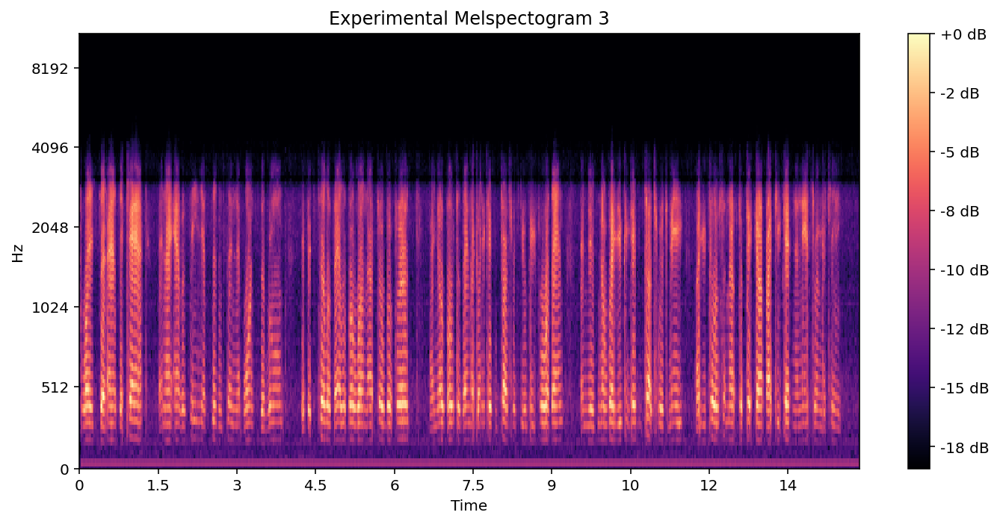

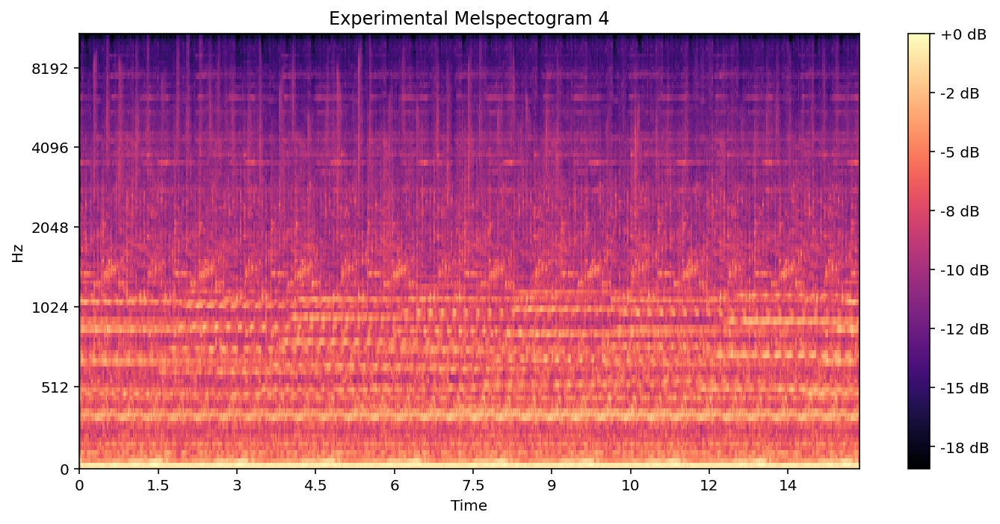

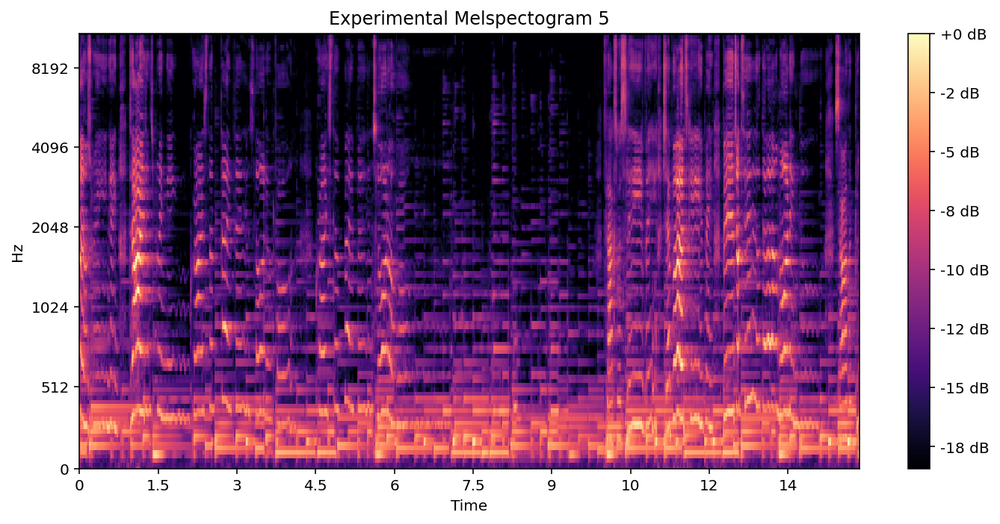





########################Folk########################



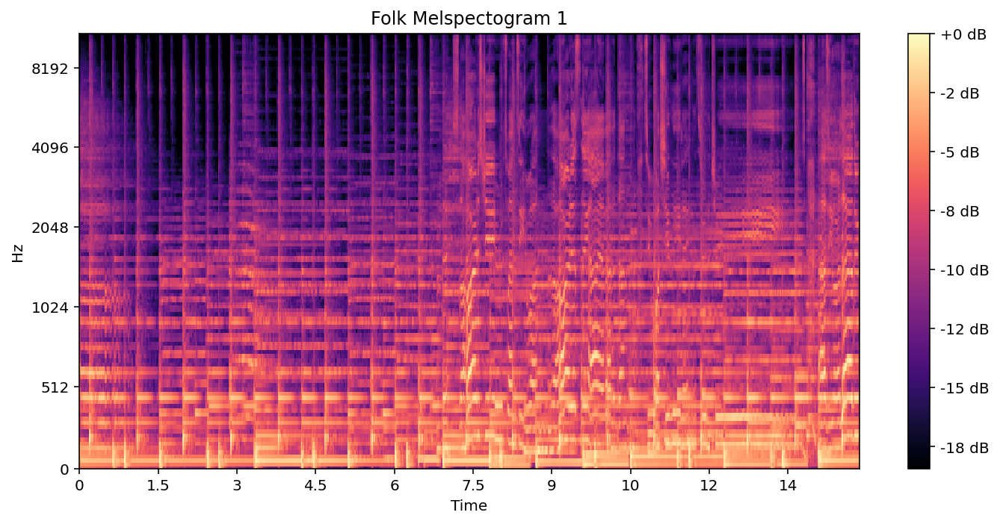

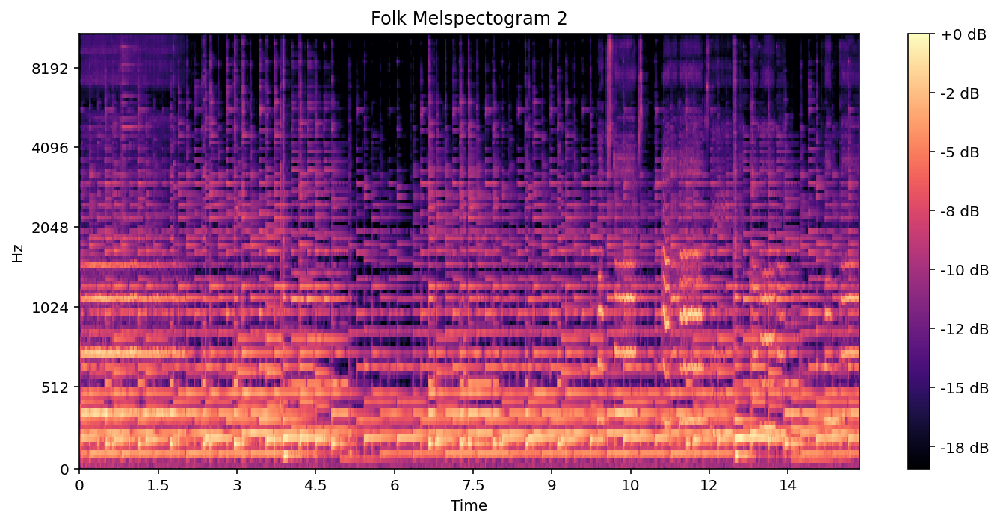

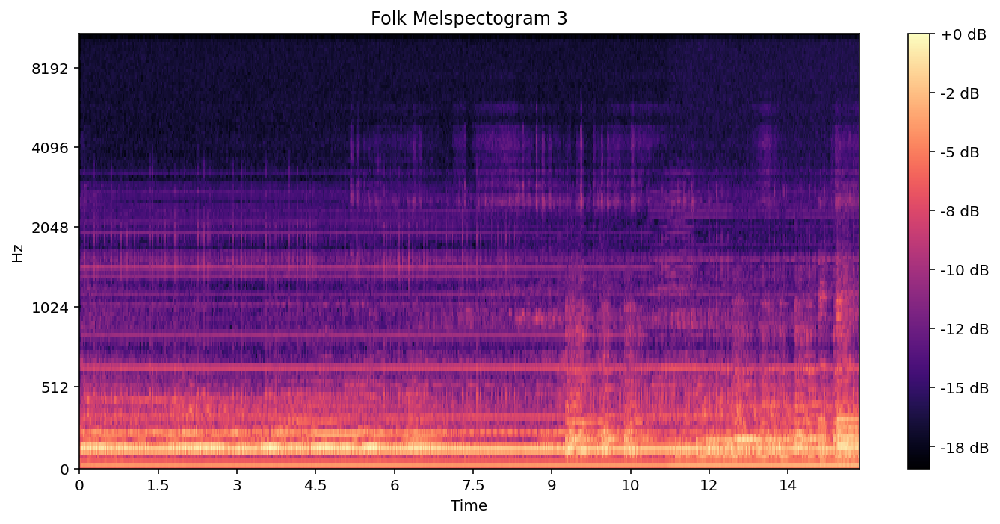

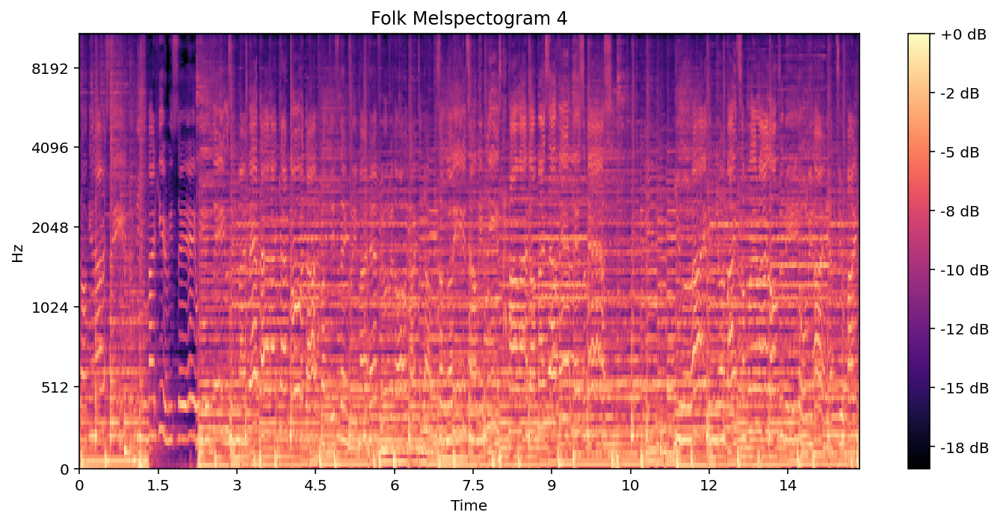

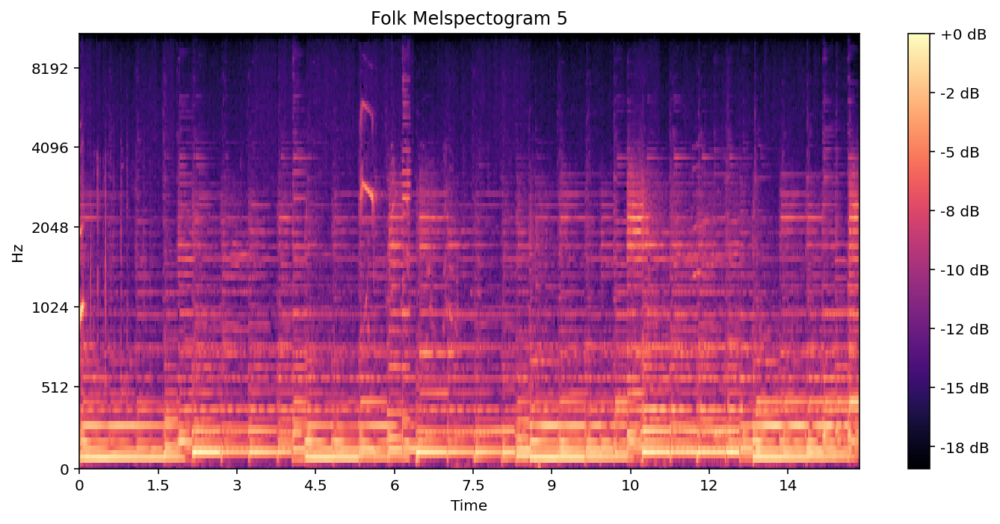





########################Hip-Hop########################



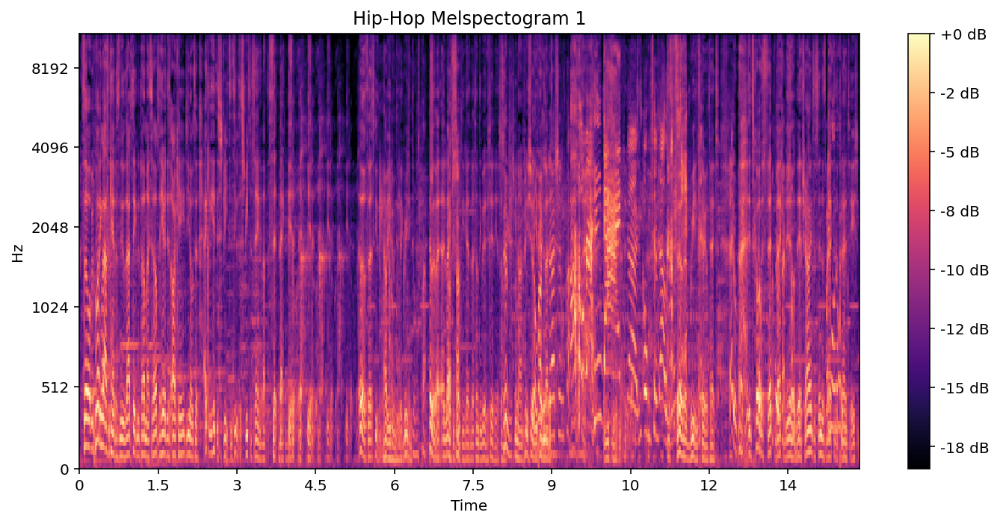

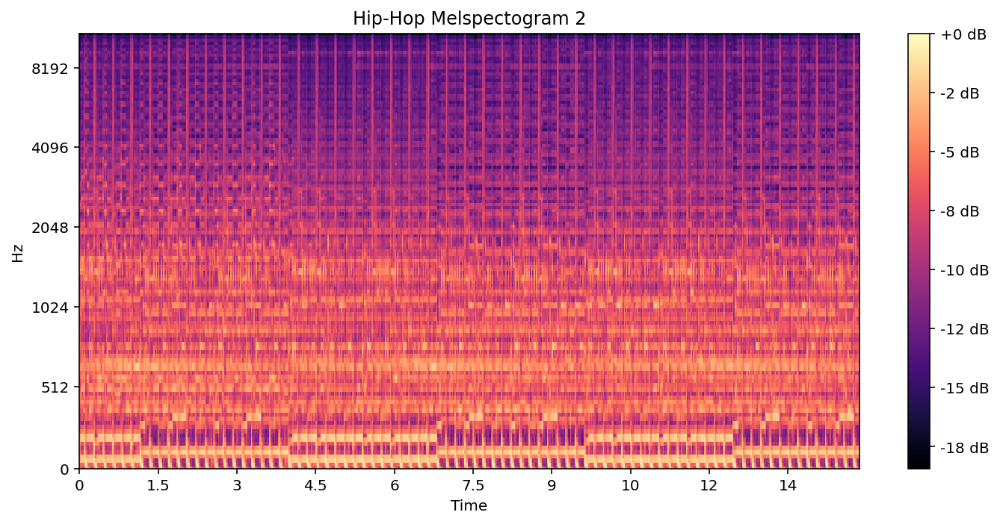

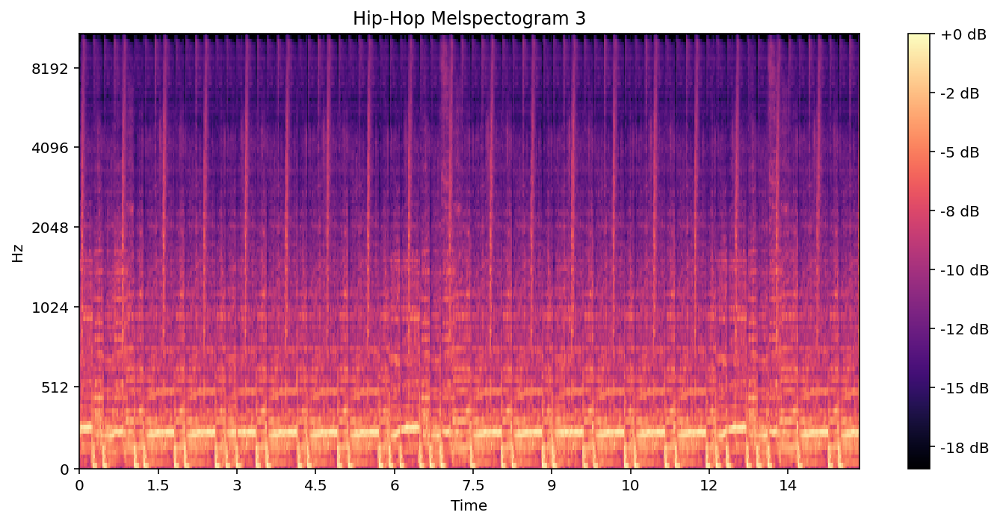

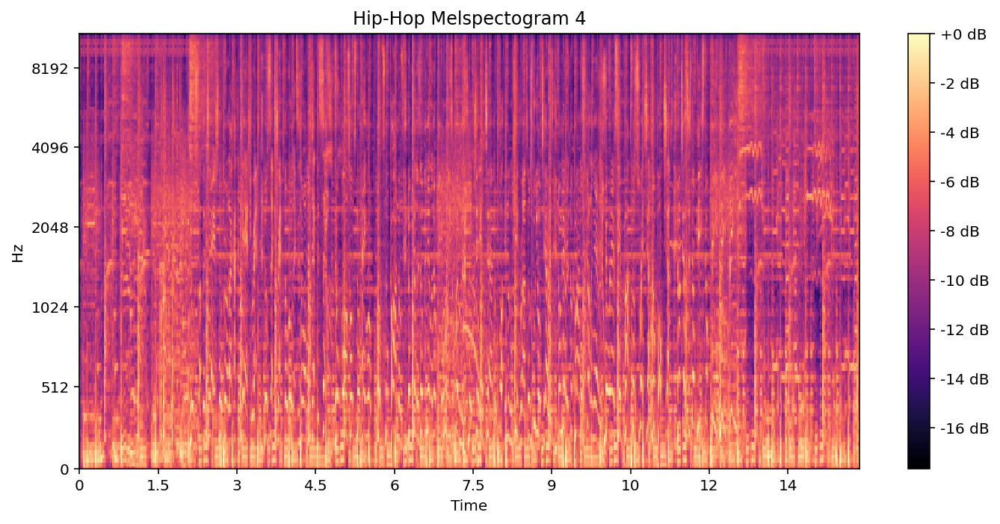

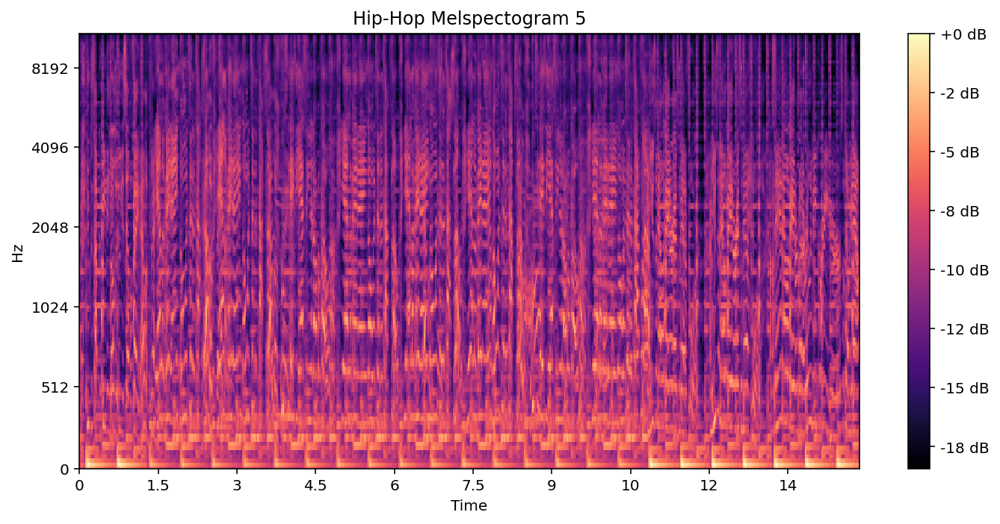





########################Instrumental########################



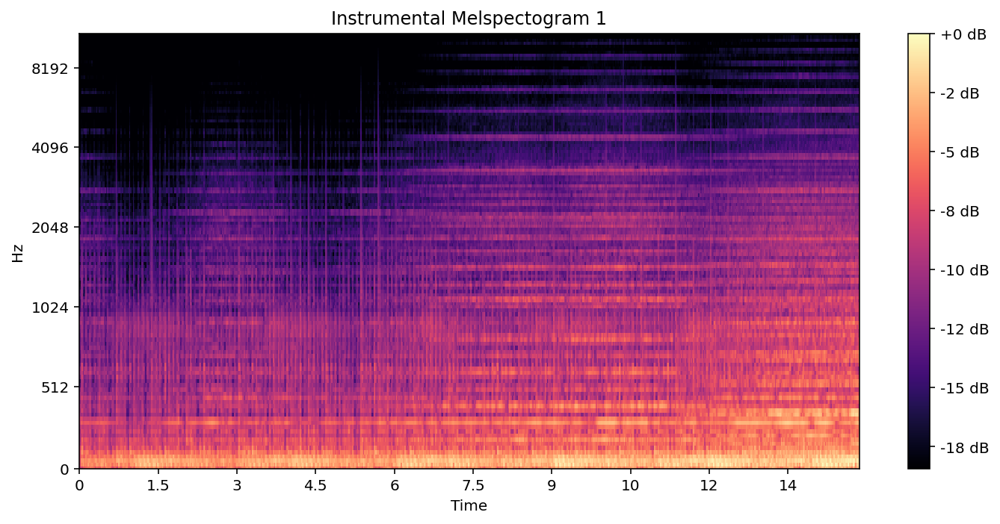

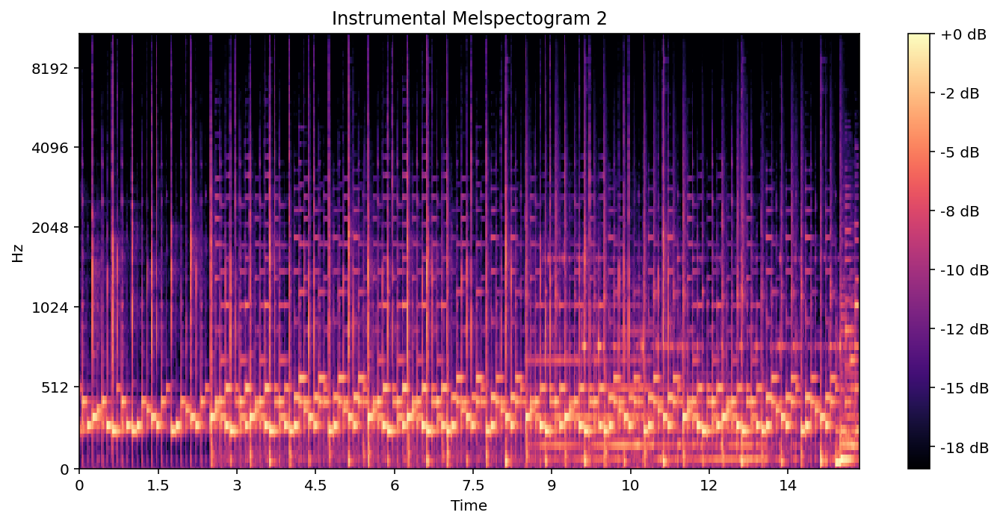

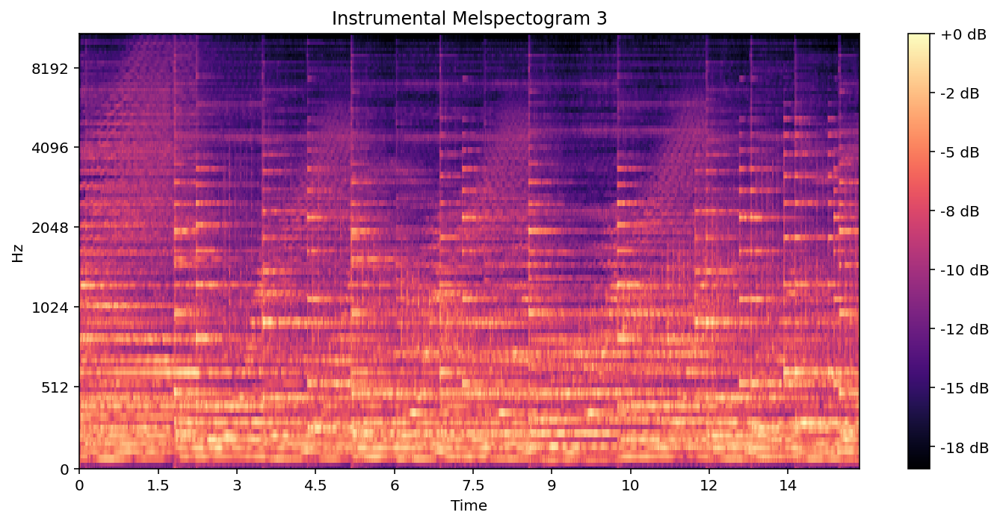

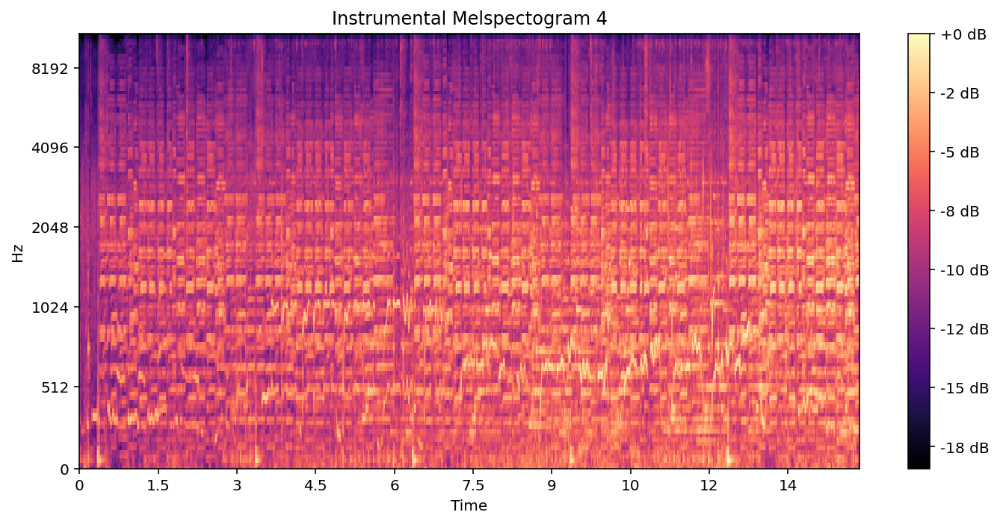

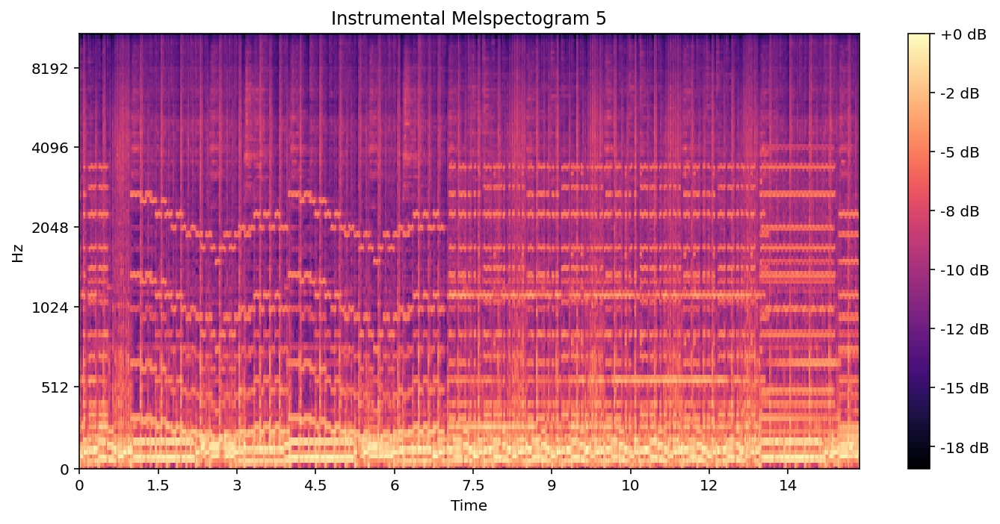





########################International########################



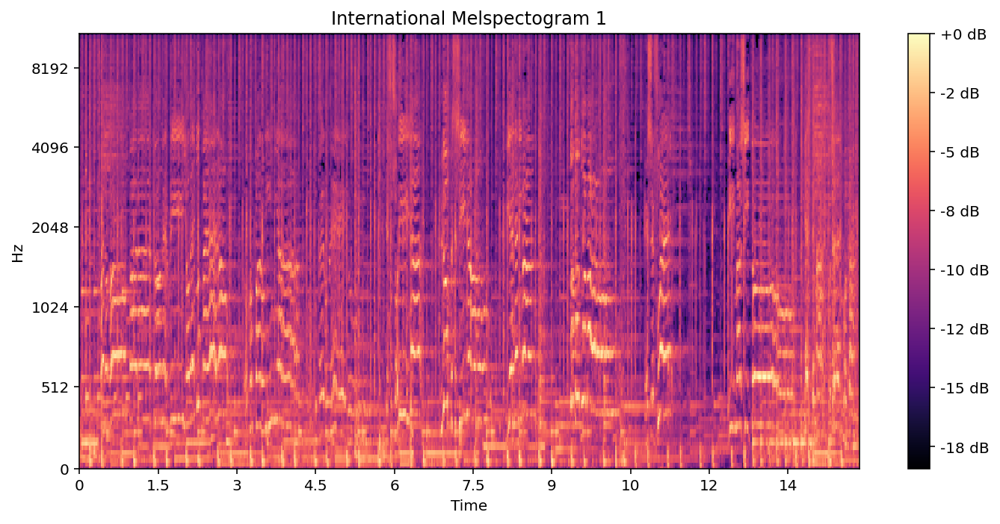

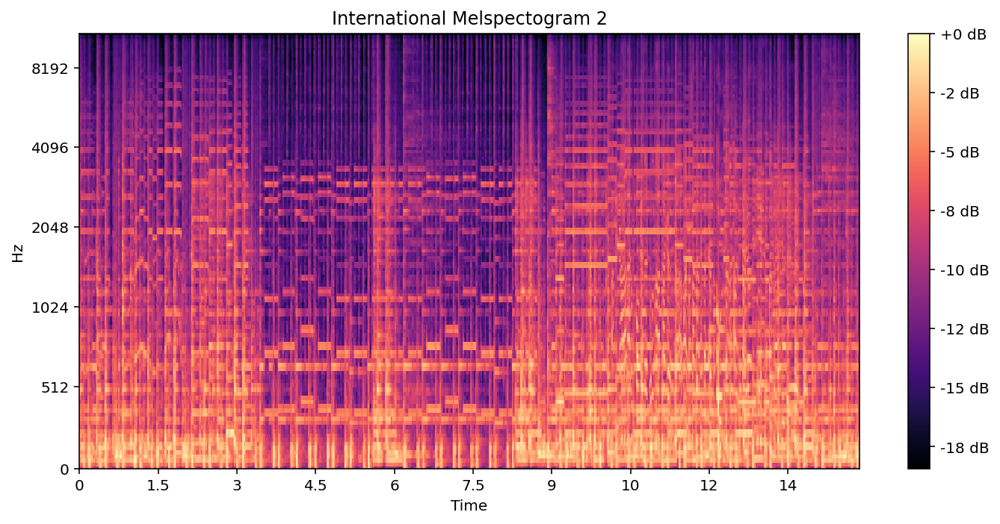

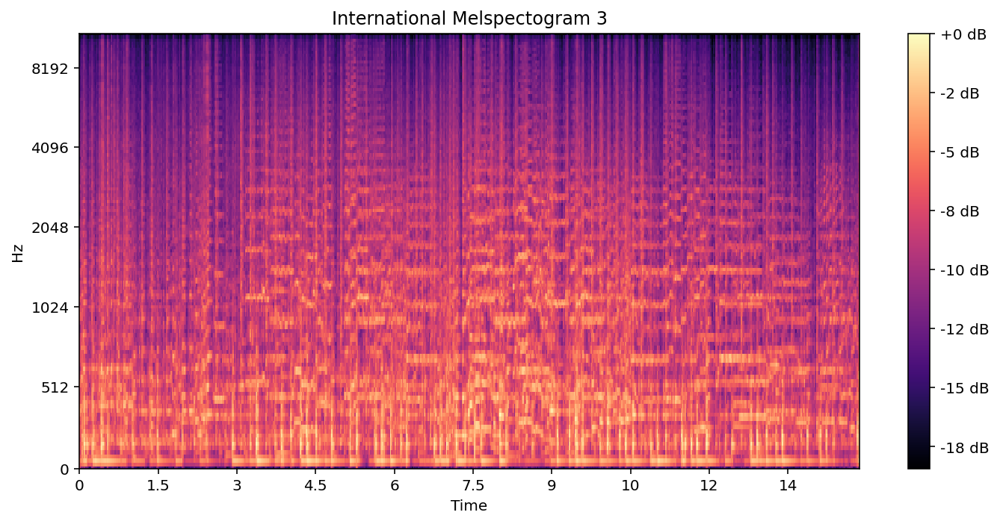

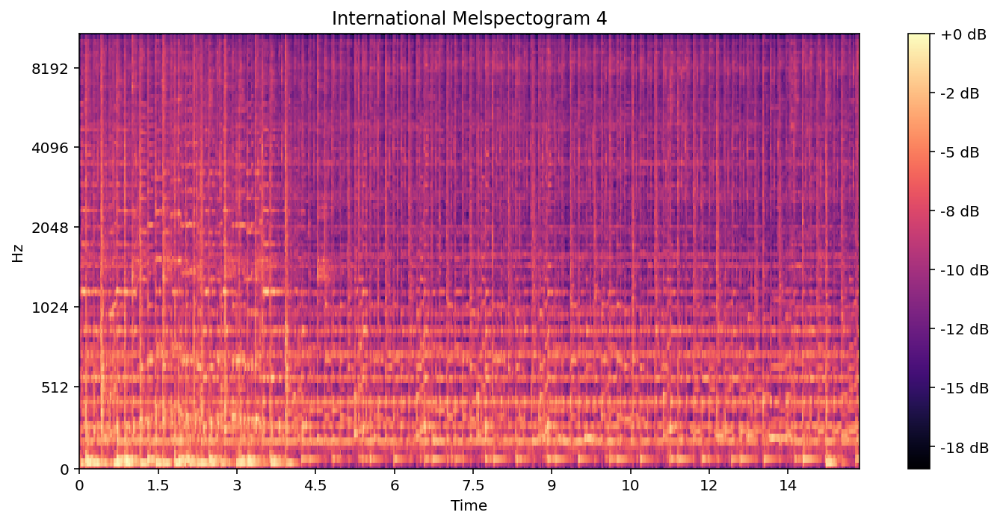

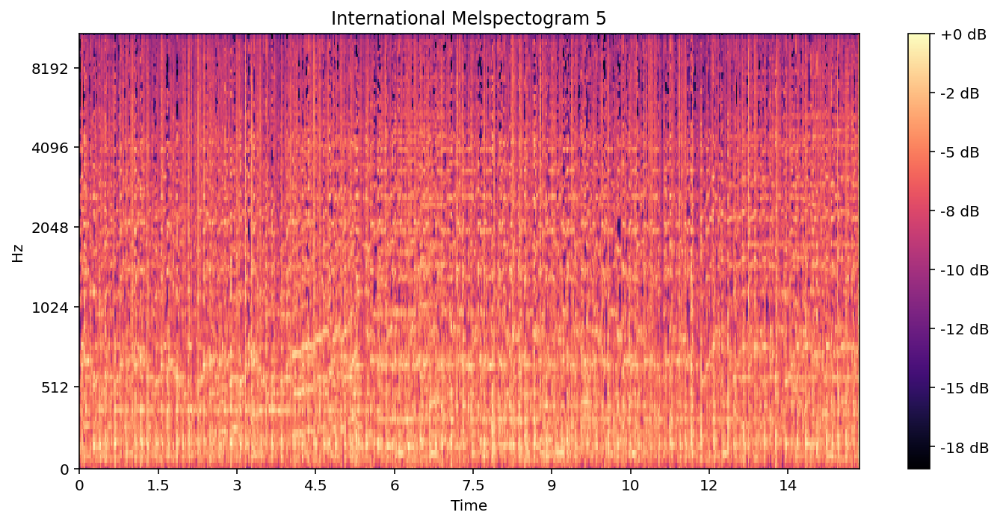





########################Pop########################



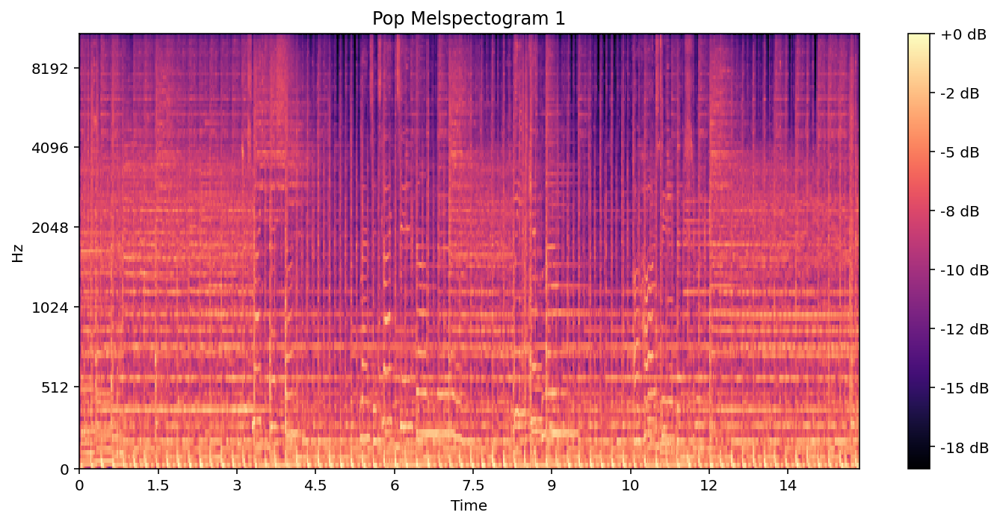

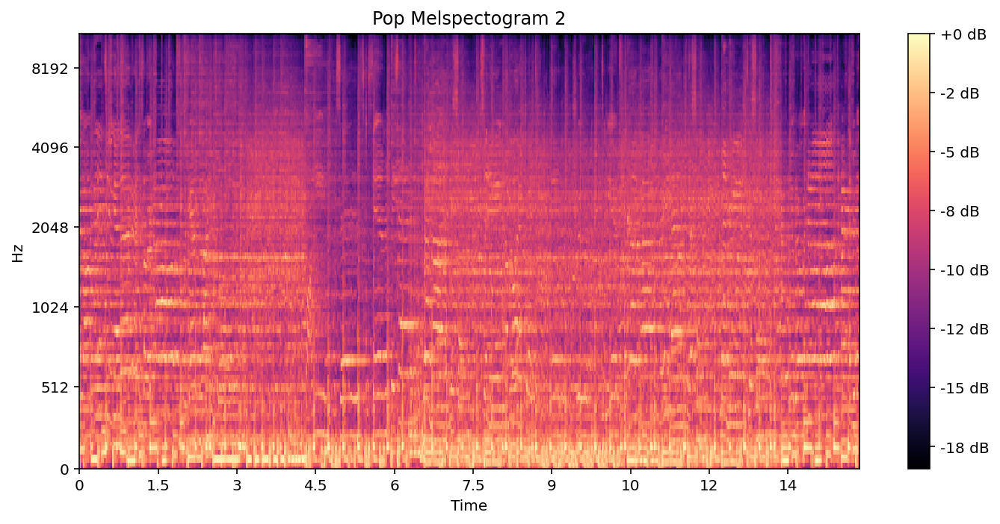

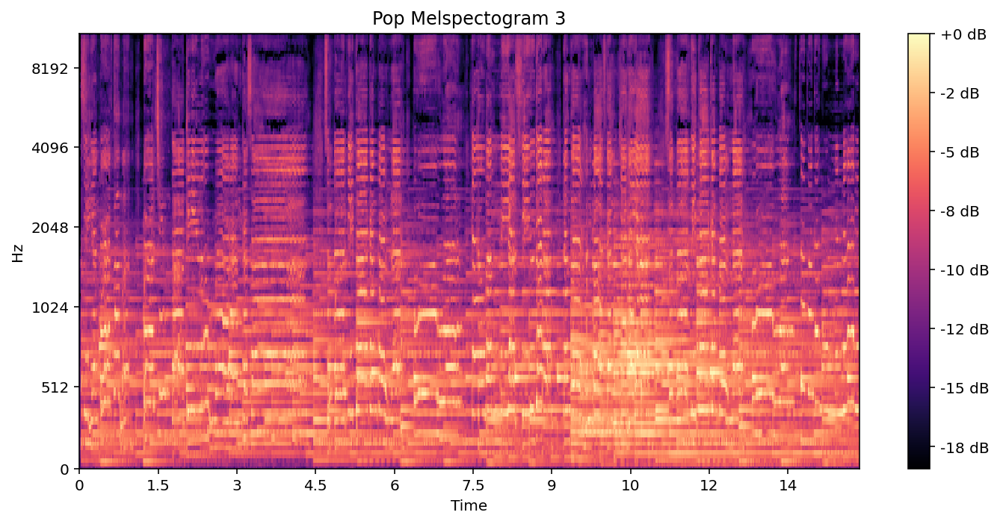

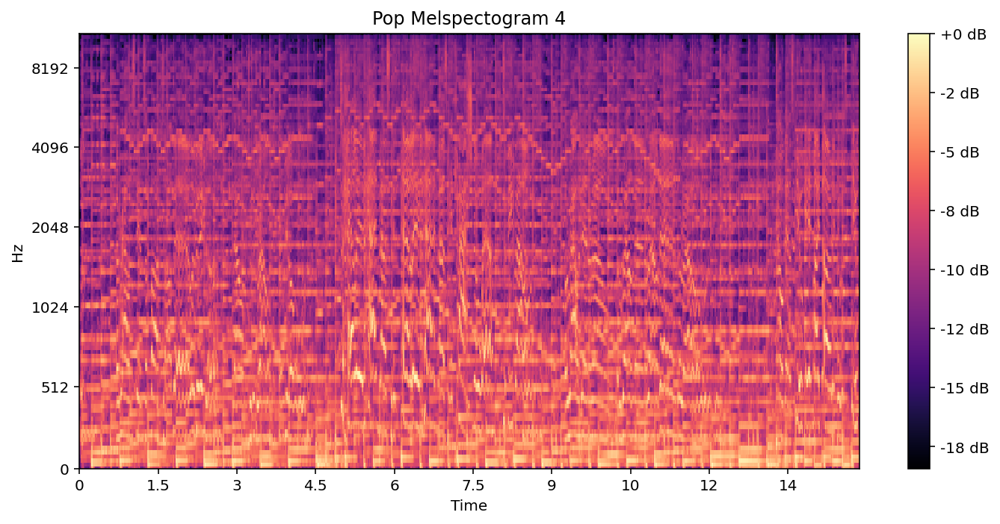

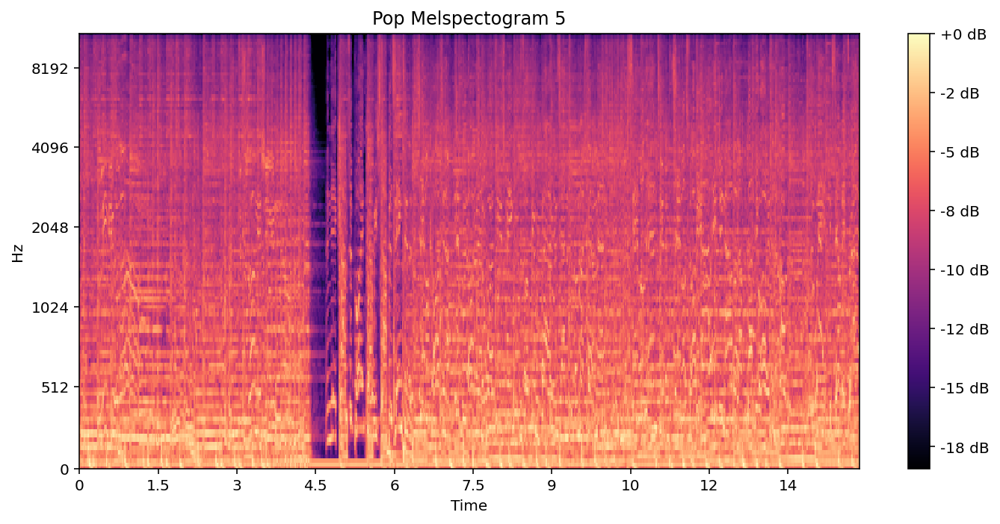





########################Rock########################



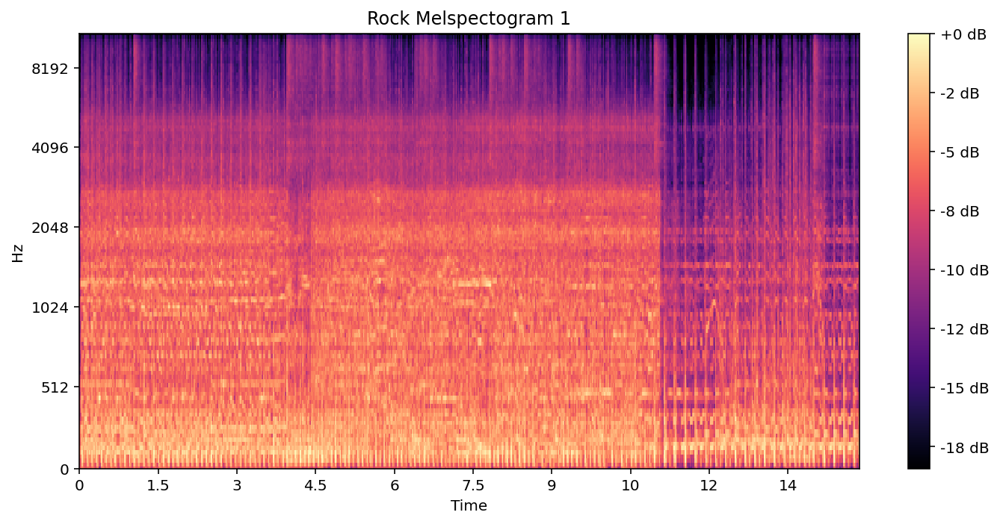

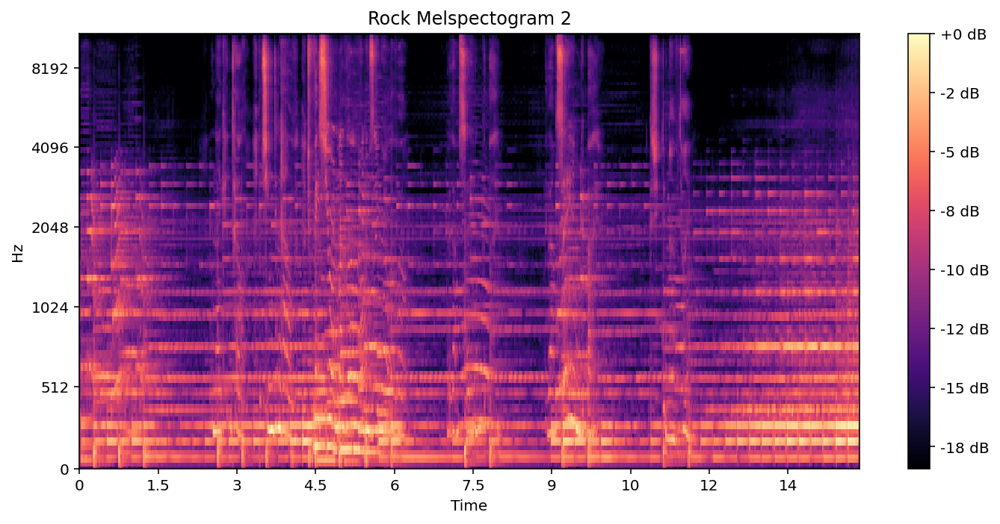

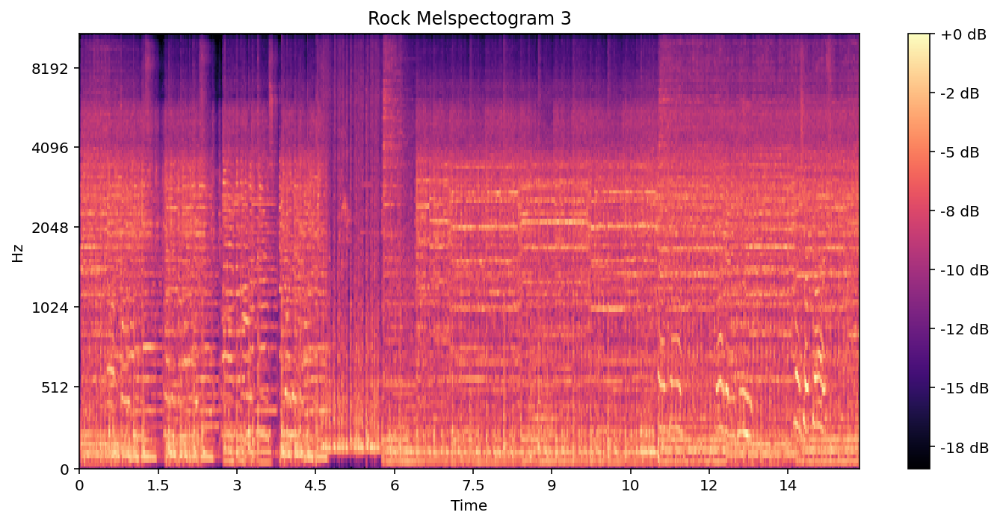

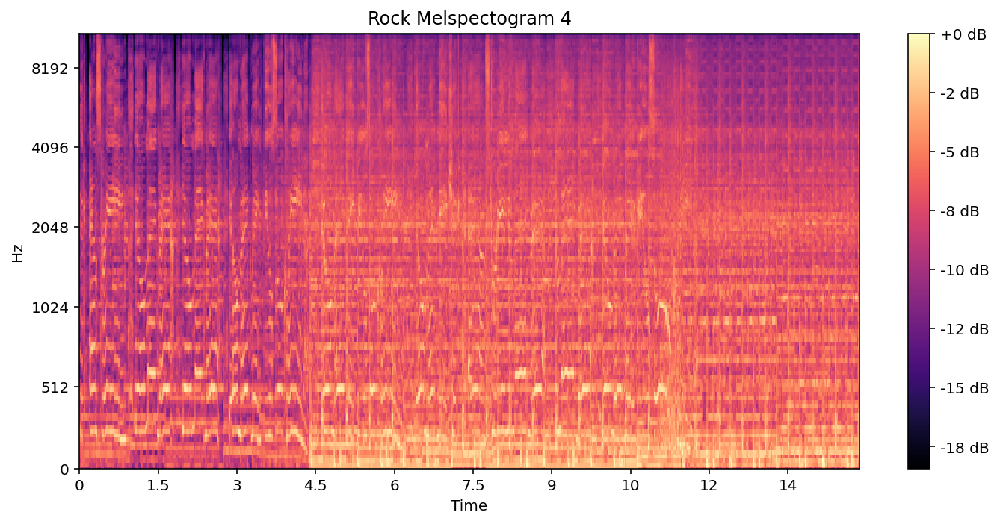

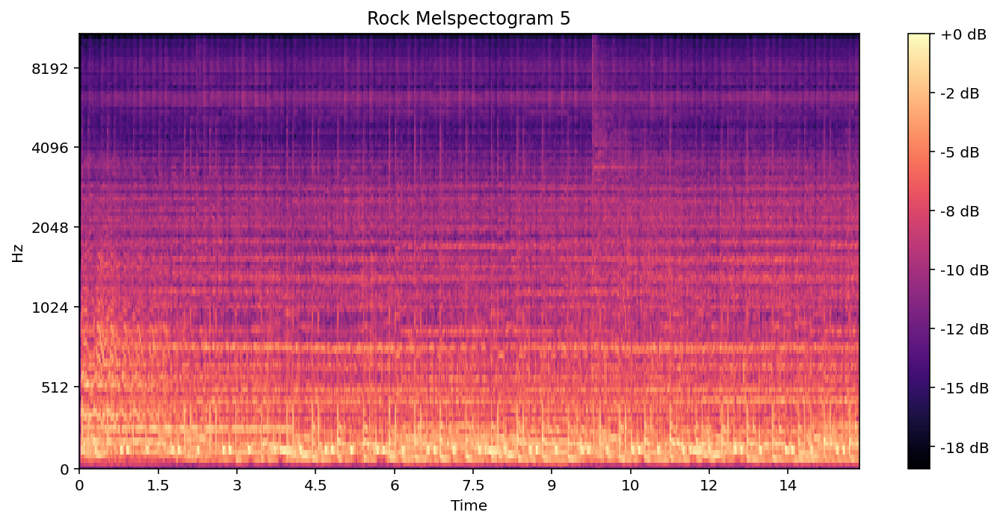

In [ ]:
genres = [k for k,v in dict_genres.items()]

for genre in genres:
  plot_spectogram_genre(genre)
  print('\n\n\n')

**When visualizing mel-spectrogram samples for the different genres of music, we've noticed some visual differences and similarities between the genres. Some possible differences and similarities include:<br><br>Temporal structure: Different genres of music have different temporal structures, such as the length and arrangement of musical phrases, the use of repetition and variation, and the use of silence or noise. These differences reflected in the mel-spectrogram as differences in the horizontal structure of the image.<br><br>Frequency content: Different genres of music have different frequency content, such as the use of particular instruments or voices that produce specific ranges of frequencies. These differences reflected in the mel-spectrogram as differences in the vertical structure of the image.<br><br>Dynamic range: Different genres of music have different dynamic ranges, or the range of loudness levels in the audio signal. These differences reflected in the mel-spectrogram as differences in the intensity or brightness of the pixels.<br><br>Overall, there may be some common features that are shared across different genres of music, such as the presence of specific instruments or vocals, and there may also be unique features that are specific to each genre. For example, if Hip-hop music often features a range of electronic and acoustic sounds, including vocals, percussion, and bass. In the mel-spectrogram, we might see relatively high energy in the lower frequencies, with a more complex pattern of energy across the frequency range, and in the other hand, International music encompasses a wide range of styles and traditions from around the world, and can feature a wide range of instruments and vocal styles. Thus, In the mel-spectrogram, we might see a wide range of frequencies represented, with a more complex or irregular pattern of energy depending on the specific style and traditions.<br><br>By analyzing the mel-spectrogram samples for different genres, we may be able to identify these features and use them for classification purposes.**

### Convolution Layer

A convolution is a kernel (a matrix of weights; also reffered to as a mask) that is applied across an image to extract spatial information by factoring each point's neighbors.  

Classical image processing uses custom kernels that can extract key features that can be used for problems like edge detection. Refer to this Wiki article for a few examples.
https://en.wikipedia.org/wiki/Kernel_(image_processing)

In deep learning, we build a model to learn more complicated kernels that can extract more specialized information.

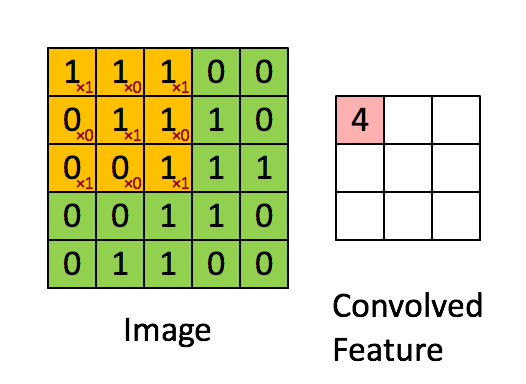

##### Question 9 (5 points)

Given a convolution layer with $f$ filters, ($k_x$ x $k_y$) kernel, and ($s_x$ x $s_y$) stride, what is the output dimension with/without padding (ie "valid" vs "same") on an ($n_x$ x $n_y$) image?

Please refer to the official keras documentation (https://keras.io/api/layers/convolution_layers/convolution2d/)

**Let's denote the output dimension as: ($o_x$ x $o_y$ x f). The formula for general padding is:<br><br>$o_x$ = $(n_x-k_x+2p)/s_x + 1$<br>$o_y$ = $(n_y-k_y+2p)/s_y + 1$<br><br>Where p = padding value (or 0 with no padding)<br><br> Specifically, for "same" padding: $((n_x-1)/s_x + 1)$ x $((n_y-1)/s_y + 1)$ x $f$,<br>where for "valid" padding, p is equal to 0, thus the output is: $((n_x-k_x)/s_x + 1)$ x $((n_y-k_y)/s_y + 1)$ x $f$**



### Pooling Layer

A pool is a very similar to a convolution layer. It is filter that is applied across the output of the convolution layer to reduce dimensionality and mitigate overfitting by summarizing the convolution results.

For this demonstration, we will be using max pooling.

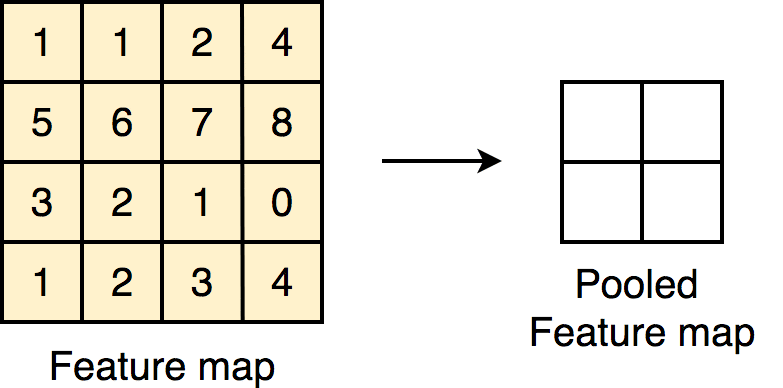

##### Question 10 (5 points)

Given a pooling layer ($p_x$ x $p_y$) pool and ($s_x$ x $s_y$) stride, what is the output dimension with/without padding (ie "valid" vs "same") on an ($n_x$ x $n_y$) image?

Please refer to the official keras documentation (https://keras.io/api/layers/pooling_layers/max_pooling2d/)

**Let's denote the output dimension as: ($o_x$ x $o_y$). The formula for general padding is:<br><br>$o_x$ = $(n_x-p_x+2p)/s_x + 1$<br>$o_y$ = $(n_y-p_y+2p)/s_y + 1$<br><br>Where p = padding value (or 0 with no padding)<br><br> Specifically, for "same" padding: ($(n_x-1)/s_x + 1)$ x $((n_y-1)/s_y + 1$),<br>where for "valid" padding, p is equal to 0, thus the output is: ($(n_x-p_x)/s_x + 1)$ x $((n_y-p_y)/s_y + 1$)**

### Now we will implement our model 
#### Parallel CNN - RNN Model

Since music has temporal features, it is obvious to use a RNN, but we saw from the melspectograms that there are also visual features that a CNN might learn. Our motivation is to try to combine both models through concatenation to extract both temporal and spatial features. 

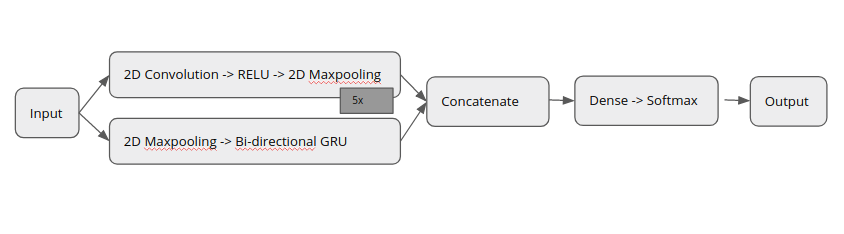

In [ ]:
# The number of possible predicted classes
num_classes = 8

# The number of features in a single data input (frequency components)
n_features = X_train.shape[2]

# The length of an input sample (in seconds)
n_time = X_train.shape[1]

In [ ]:
def conv_recurrent_model_build(model_input):
    print('Building model...')
    layer = model_input
    
    ### Convolutional blocks    
    conv_1 = Conv2D(filters=16, kernel_size=(3,1), strides=1,
                    padding='valid', activation='relu', name='conv_1')(layer)
    pool_1 = MaxPooling2D((2,2))(conv_1)

    # Your Code Here
    conv_2 = Conv2D(filters=32, kernel_size=(3,1), strides=1,
                    padding='valid', activation='relu', name='conv_2')(pool_1)
    pool_2 = MaxPooling2D((2,2))(conv_2)
    
    conv_3 = Conv2D(filters=64, kernel_size=(3,1), strides=1,
                    padding='valid', activation='relu', name='conv_3')(pool_2)
    pool_3 = MaxPooling2D((2,2))(conv_3)
    
    conv_4 = Conv2D(filters=64, kernel_size=(3,1), strides=1,
                    padding='valid', activation='relu', name='conv_4')(pool_3)
    pool_4 = MaxPooling2D((4,4))(conv_4)
    
    conv_5 = Conv2D(filters=64, kernel_size=(3,1), strides=1,
                    padding='valid', activation='relu', name='conv_5')(pool_4)
    pool_5 = MaxPooling2D((4,4))(conv_5)

    flatten1 = Flatten()(pool_5)
    
    ### Recurrent Block
    lstm_count = 64
    
    # Pooling layer
    pool_lstm1 = MaxPooling2D((4,2), name = 'pool_lstm')(layer)
    
    # Embedding layer
    squeezed = Lambda(lambda x: K.squeeze(x, axis= -1))(pool_lstm1)
    
    # Bidirectional GRU
    lstm = Bidirectional(GRU(lstm_count))(squeezed)  #default merge mode is concat
    
    # Concat Output
    concat = concatenate([flatten1, lstm], axis=-1, name ='concat')
    
    ## Softmax Output
    output = Dense(num_classes, activation = 'softmax', name='preds')(concat)
    
    model_output = output
    model = Model(model_input, model_output)
    
    opt = RMSprop(learning_rate=0.0005)  # Optimizer
    model.compile(
            loss='categorical_crossentropy',
            optimizer=opt,
            metrics=['accuracy']
        )

    return model

##### Question 11 (15 points)

Fill in the missing code for the cell above and implement the four missing convolution layers interwoven with max pooling layers. When you run the commented-out code below, your output should match the image below. Use the first convolution and pooling layer as an example. 

All of the convolution layers should have the same kernel size, stride, padding, and activation function.

If you are stuck, this article should help:
https://towardsdatascience.com/how-to-calculate-the-number-of-parameters-in-keras-models-710683dae0ca



In [ ]:
n_frequency = 128
n_frames = 640
input_shape = (n_frames, n_frequency, 1)
model_input = Input(input_shape, name='input')
model = conv_recurrent_model_build(model_input)

Building model...


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Hint: use print(model.summary()) to check if your model satisfies the requirements of the specifications above. 

In [ ]:
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 640, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv_1 (Conv2D)                (None, 638, 128, 16  64          ['input[0][0]']                  
                                )                                                                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 319, 64, 16)  0           ['conv_1[0][0]']                 
                                                                                              

In [ ]:
def train_model(x_train, y_train, x_val, y_val):
    
    n_frequency = 128
    n_frames = 640
    
    x_train = np.expand_dims(x_train, axis = -1)
    x_val = np.expand_dims(x_val, axis = -1)
    
    input_shape = (n_frames, n_frequency, 1)
    model_input = Input(input_shape, name='input')
    
    model = conv_recurrent_model_build(model_input)  ### Step 1
    
    checkpoint_callback = ModelCheckpoint('./models/parallel/weights.best.h5', monitor='val_accuracy', verbose=1,
                                          save_best_only=True, mode='max')
    
    reducelr_callback = ReduceLROnPlateau(
                monitor='val_accuracy', factor=0.5, patience=10, min_delta=0.01,
                verbose=1
            )
    
    callbacks_list = [checkpoint_callback, reducelr_callback]

    # Fit the model and get training history.
    print('Training...')
    history = model.fit(x_train, y_train, batch_size=64, epochs=10,
                        validation_data=(x_val, y_val), verbose=1, callbacks=callbacks_list) ### Step 2
    
    '''
    test_accuracy = model.eval(x_test, y_test)   ### Step 3
    '''

    return model, history

In [ ]:
def show_summary_stats(history):
    # List all data in history
    print(history.history.keys())

    # Summarize history for accuracy
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # Summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

In [ ]:
model, history = train_model(X_train, y_train, X_valid, y_valid)

Building model...


Training...
Train on 6394 samples, validate on 800 samples
Epoch 1/10
6394/6394 [==============================] - ETA: 0s - loss: 1.8954 - acc: 0.2782

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


6394/6394 [==============================] - 46s 7ms/sample - loss: 1.8954 - acc: 0.2782 - val_loss: 1.7976 - val_acc: 0.3050 - lr: 5.0000e-04
Epoch 2/10
6394/6394 [==============================] - ETA: 0s - loss: 1.7333 - acc: 0.3569

6394/6394 [==============================] - 38s 6ms/sample - loss: 1.7333 - acc: 0.3569 - val_loss: 1.6596 - val_acc: 0.3875 - lr: 5.0000e-04
Epoch 3/10
6394/6394 [==============================] - ETA: 0s - loss: 1.6648 - acc: 0.3904

6394/6394 [==============================] - 37s 6ms/sample - loss: 1.6648 - acc: 0.3904 - val_loss: 1.7432 - val_acc: 0.3487 - lr: 5.0000e-04
Epoch 4/10
6394/6394 [==============================] - ETA: 0s - loss: 1.6145 - acc: 0.4073

6394/6394 [==============================] - 37s 6ms/sample - loss: 1.6145 - acc: 0.4073 - val_loss: 1.7063 - val_acc: 0.3525 - lr: 5.0000e-04
Epoch 5/10
6394/6394 [==============================] - ETA: 0s - loss: 1.5763 - acc: 0.4246

6394/6394 [==============================] - 37s 6ms/sample - loss: 1.5763 - acc: 0.4246 - val_loss: 1.5689 - val_acc: 0.4100 - lr: 5.0000e-04
Epoch 6/10
6394/6394 [==============================] - ETA: 0s - loss: 1.5468 - acc: 0.4482

6394/6394 [==============================] - 38s 6ms/sample - loss: 1.5468 - acc: 0.4482 - val_loss: 1.6251 - val_acc: 0.4013 - lr: 5.0000e-04
Epoch 7/10
6394/6394 [==============================] - ETA: 0s - loss: 1.5213 - acc: 0.4564

6394/6394 [==============================] - 37s 6ms/sample - loss: 1.5213 - acc: 0.4564 - val_loss: 1.6283 - val_acc: 0.3762 - lr: 5.0000e-04
Epoch 8/10
6394/6394 [==============================] - ETA: 0s - loss: 1.5011 - acc: 0.4654

6394/6394 [==============================] - 37s 6ms/sample - loss: 1.5011 - acc: 0.4654 - val_loss: 1.5804 - val_acc: 0.4338 - lr: 5.0000e-04
Epoch 9/10
6394/6394 [==============================] - ETA: 0s - loss: 1.4850 - acc: 0.4689

6394/6394 [==============================] - 37s 6ms/sample - loss: 1.4850 - acc: 0.4689 - val_loss: 1.6542 - val_acc: 0.3825 - lr: 5.0000e-04
Epoch 10/10
6394/6394 [==============================] - ETA: 0s - loss: 1.4611 - acc: 0.4815

6394/6394 [==============================] - 38s 6ms/sample - loss: 1.4611 - acc: 0.4815 - val_loss: 1.5444 - val_acc: 0.4288 - lr: 5.0000e-04


### Results


dict_keys(['loss', 'acc', 'val_loss', 'val_acc', 'lr'])


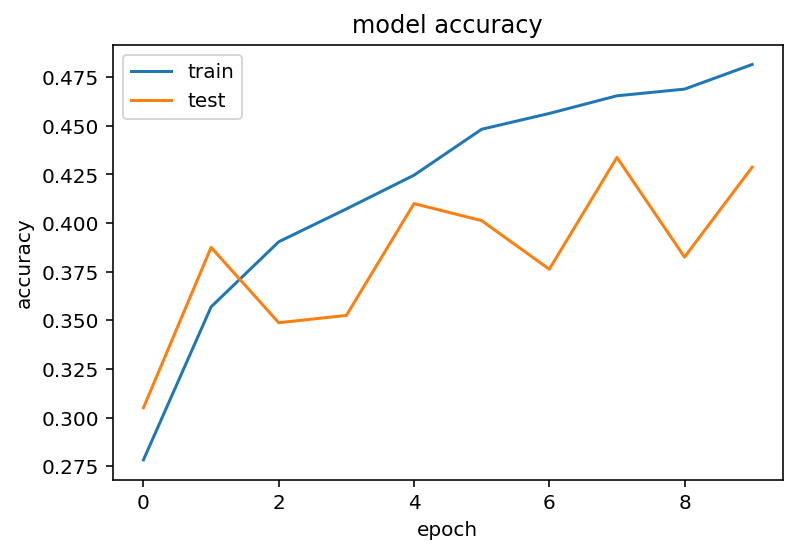

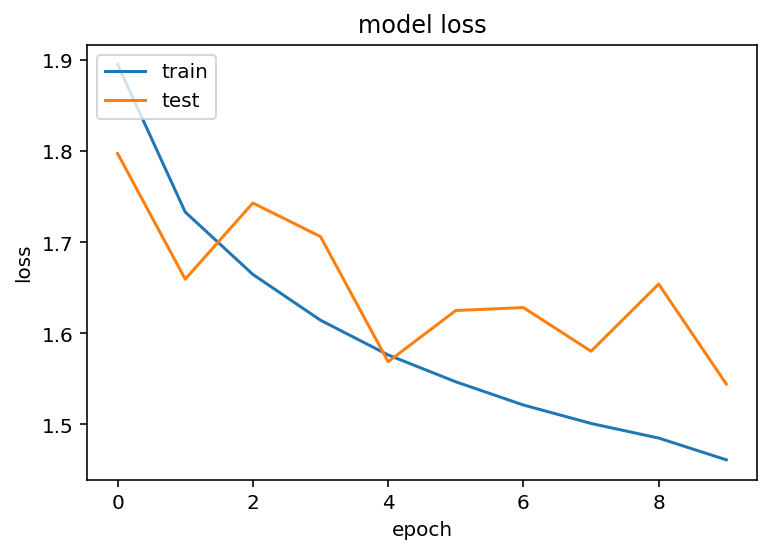

In [ ]:
show_summary_stats(history)

In [ ]:
from sklearn.metrics import classification_report

y_true = np.argmax(y_valid, axis = 1)
X_valid = np.expand_dims(X_valid, axis = -1)
y_pred = model.predict(X_valid)
y_pred = np.argmax(y_pred, axis=1)
labels = [0,1,2,3,4,5,6,7]
target_names = dict_genres.keys()

print(y_true.shape, y_pred.shape)
print(classification_report(y_true, y_pred, target_names=target_names))

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


(800,) (800,)
               precision    recall  f1-score   support

   Electronic       0.49      0.36      0.41       100
 Experimental       0.38      0.23      0.29       100
         Folk       0.65      0.43      0.52       100
      Hip-Hop       0.47      0.71      0.56       100
 Instrumental       0.38      0.35      0.37       100
International       0.70      0.39      0.50       100
          Pop       0.13      0.14      0.13       100
         Rock       0.43      0.82      0.56       100

     accuracy                           0.43       800
    macro avg       0.45      0.43      0.42       800
 weighted avg       0.45      0.43      0.42       800



##### Question 12 (5 points)

Briefly describe, in a few sentences, the training results. Does the model perform well? What can we learn from the train and test loss curves? Is the model overfitted? What do the metrics tell us?

*Note that you can increase the number of epochs to get a better picture of the models performance

**First, note that we increased the number of epoches to 10 in order to get a better picture of the models performance.<br><br>Based on the training results described, it appears that the model isn't performing so well, and that it abit overfitted to the training data. The train and test loss curves show that the loss is decreasing per epoch, which is generally a good sign and indicates that the model is learning. However, the overall model accuracy is low and the fact that the train accuracy is higher than the test accuracy, suggests that the model is able to accurately classify the training data, but is not able to generalize well to the test data.<br><br>Generally, overfitting occurs when a model becomes too complex or is trained for too long, and learns patterns in the training data that are not representative of the underlying relationship between the inputs and outputs. As a result, the model performs well on the training data, but poorly on unseen data.<br><br>Overall, the metrics suggest that the model is not performing well and is abit overfitted. To improve the performance of the model, it may be necessary to try different model architectures, modify the hyperparameters and the training process, or use a larger or more diverse training dataset. Also, Regularization is a technique that can help prevent overfitting by adding a penalty to the loss function to discourage the model from learning overly-complex patterns in the data.**

### Visualizing the Model

1
input_1 (1, 640, 128, 1) 


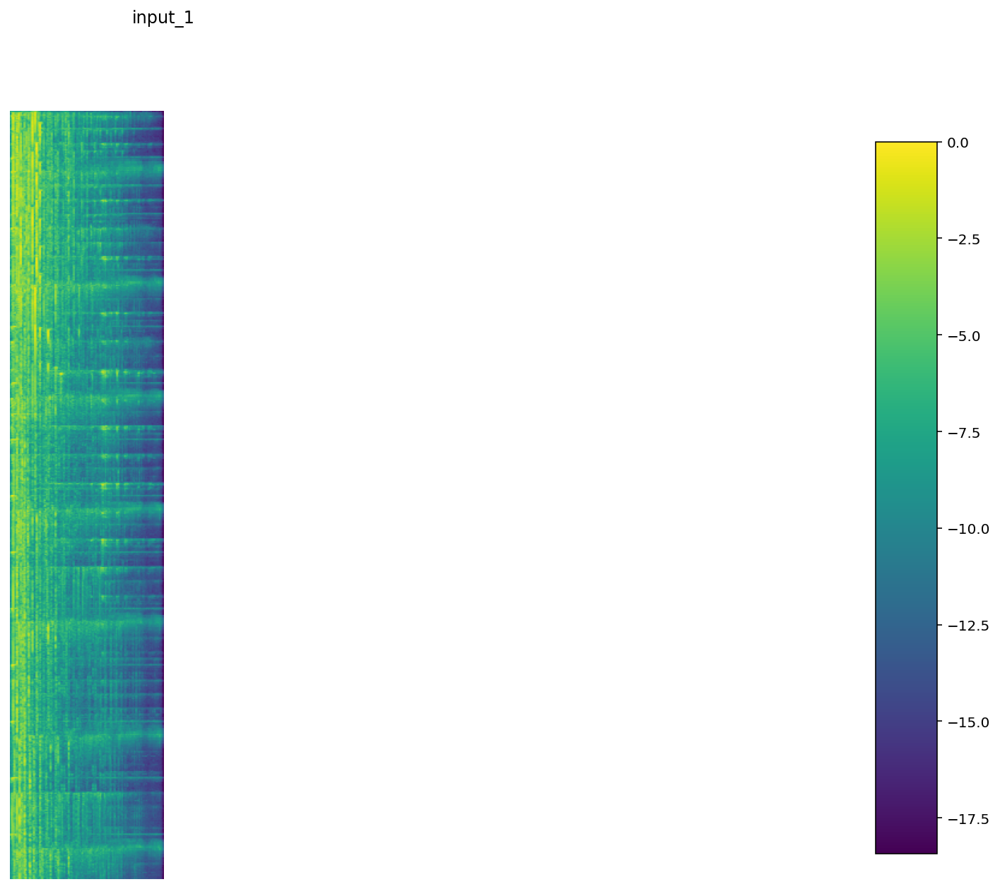

conv_1 (1, 638, 128, 16) 


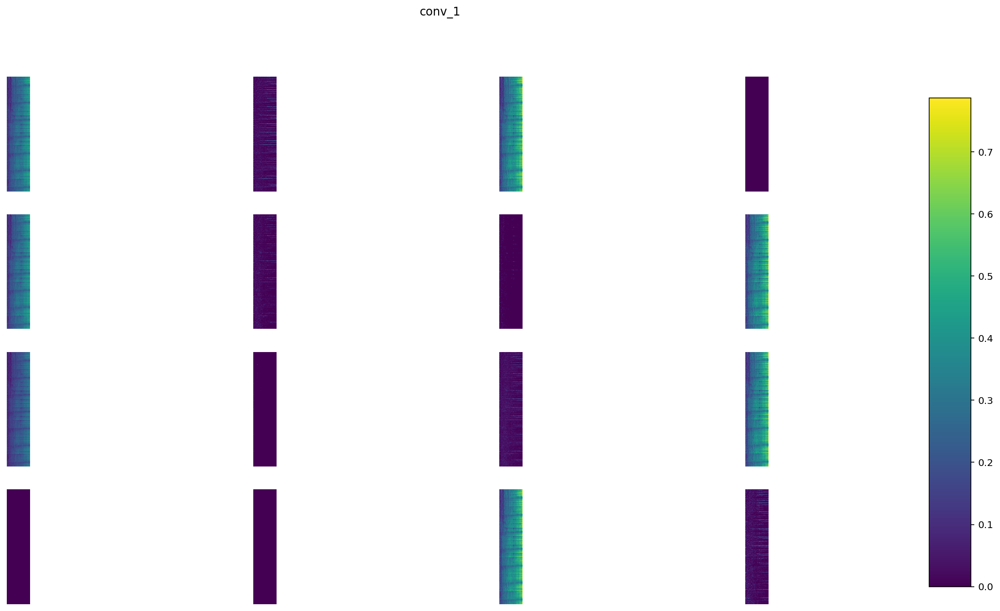

max_pooling2d_5 (1, 319, 64, 16) 


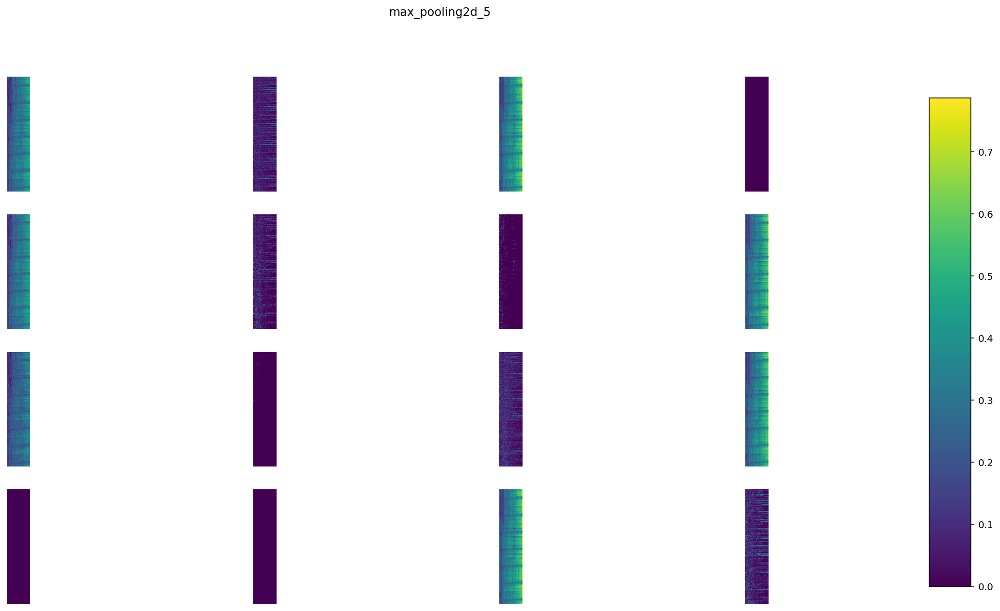

conv_2 (1, 317, 64, 32) 


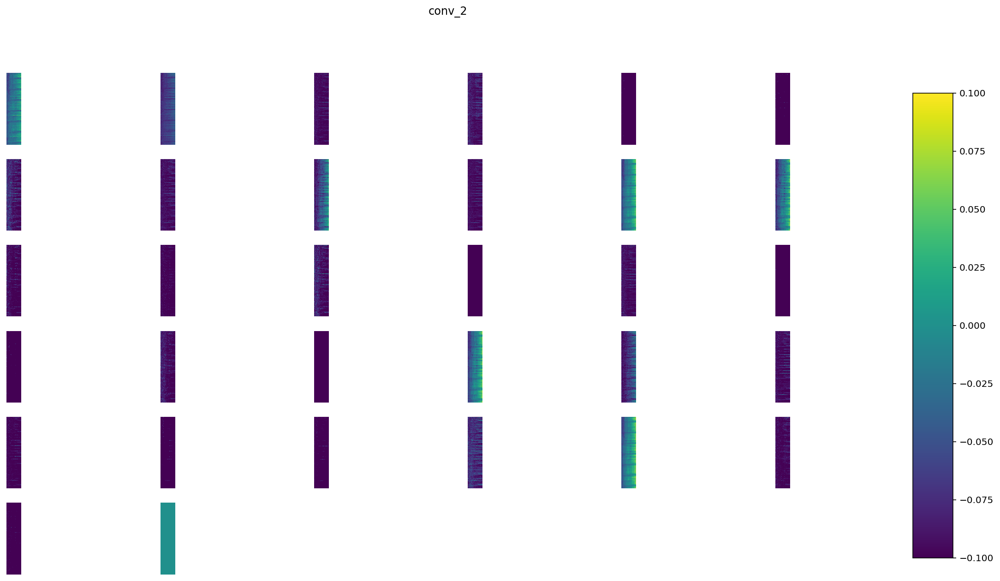

max_pooling2d_6 (1, 158, 32, 32) 


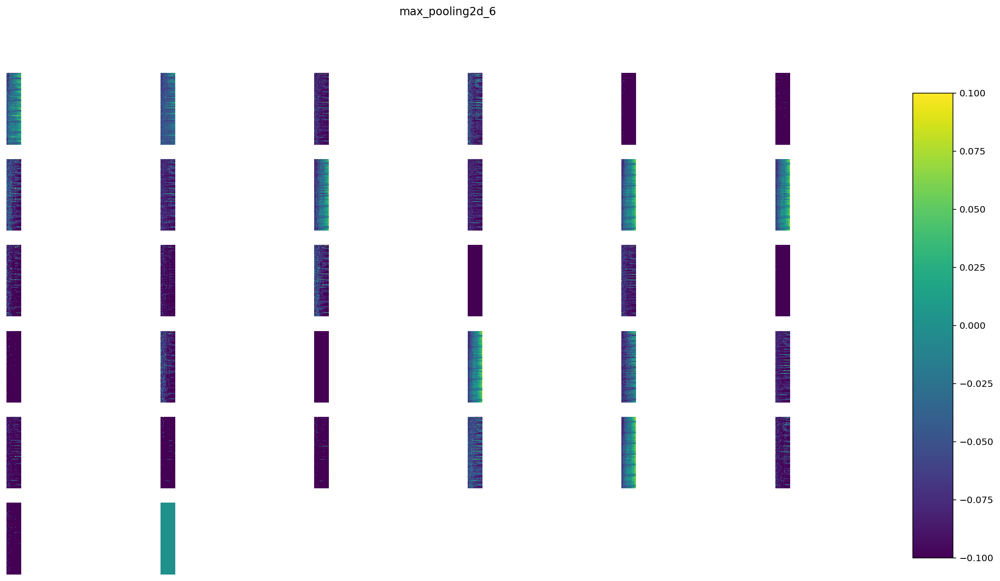

conv_3 (1, 156, 32, 64) 


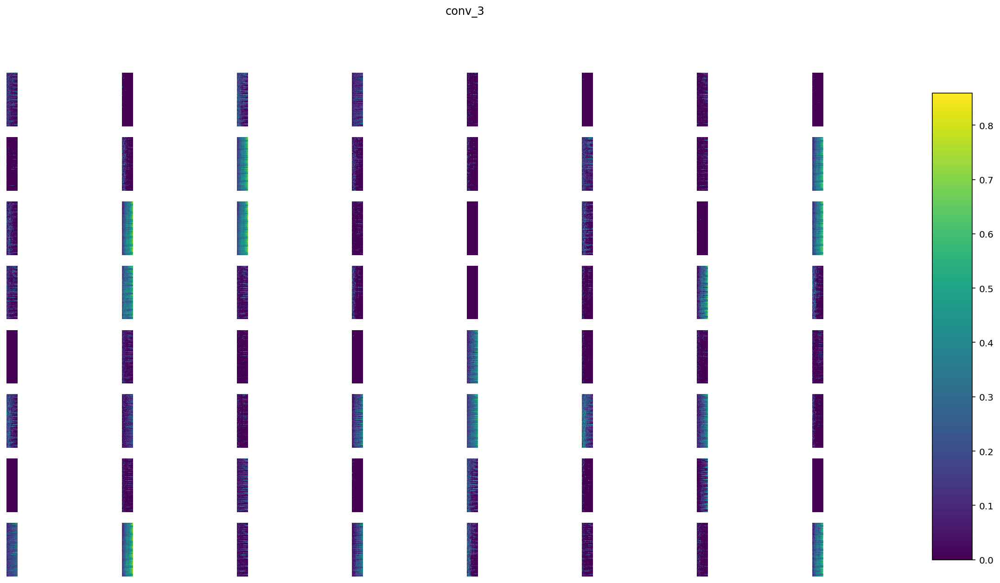

max_pooling2d_7 (1, 78, 16, 64) 


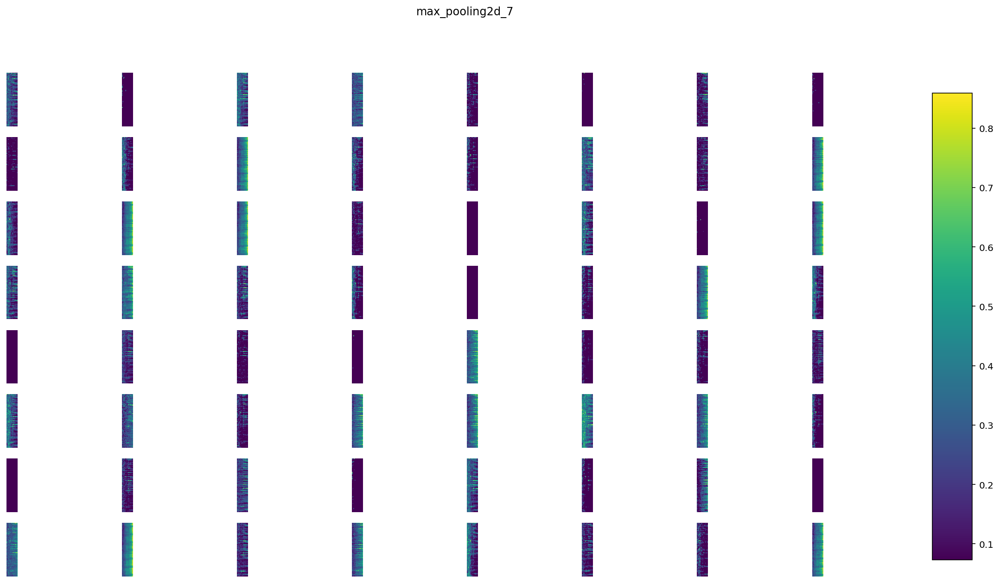

conv_4 (1, 76, 16, 64) 


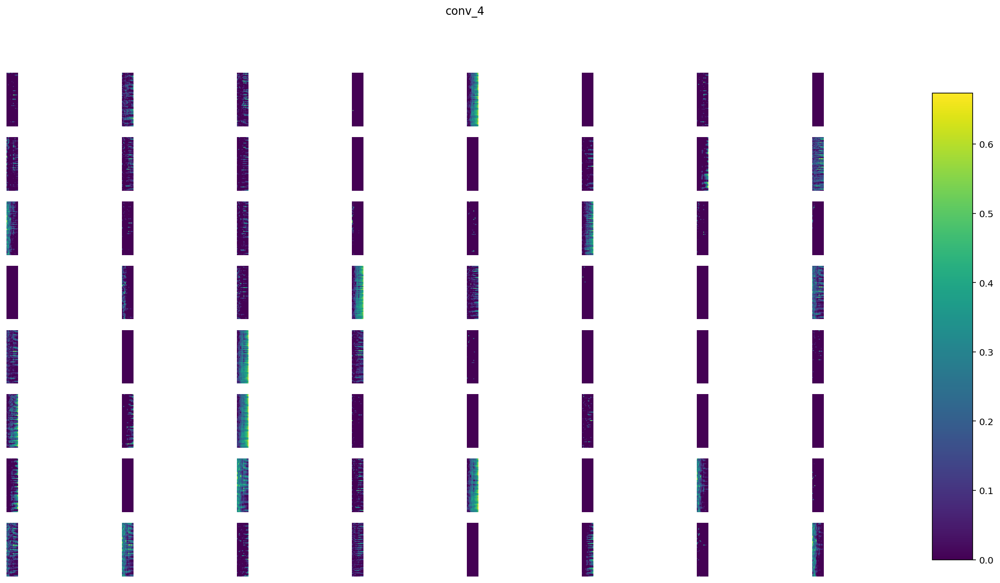

max_pooling2d_8 (1, 19, 4, 64) 


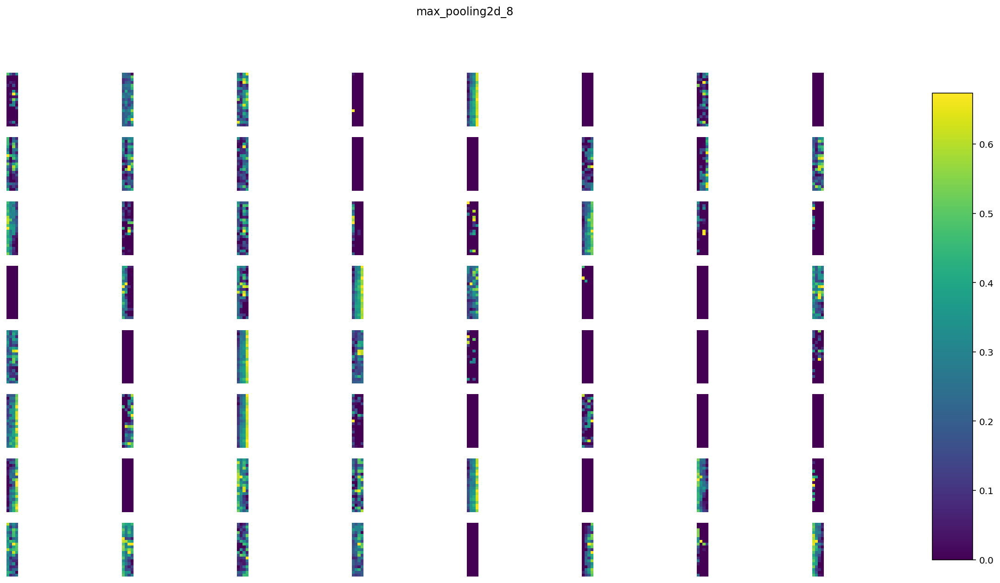

conv_5 (1, 17, 4, 64) 


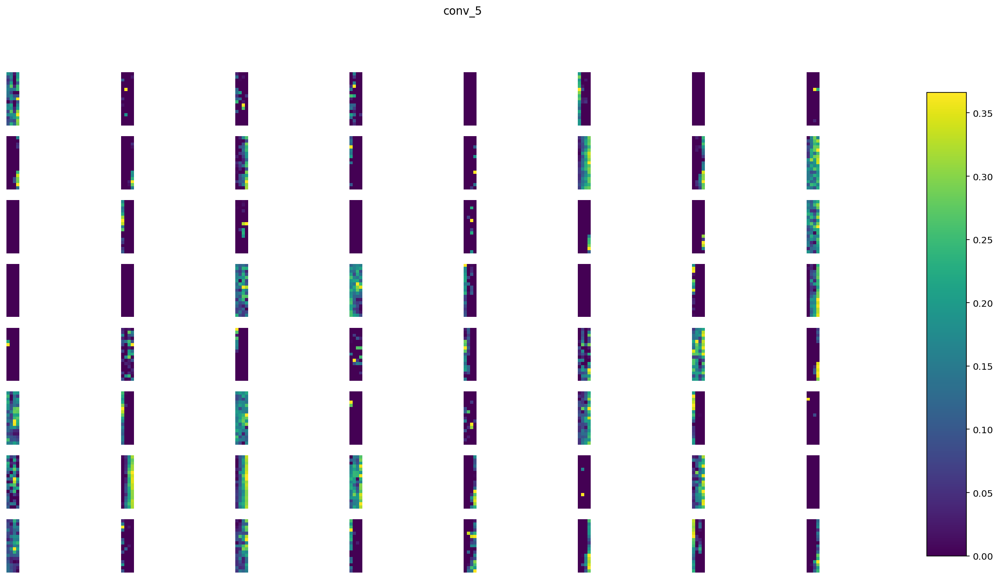

pool_lstm (1, 160, 64, 1) 


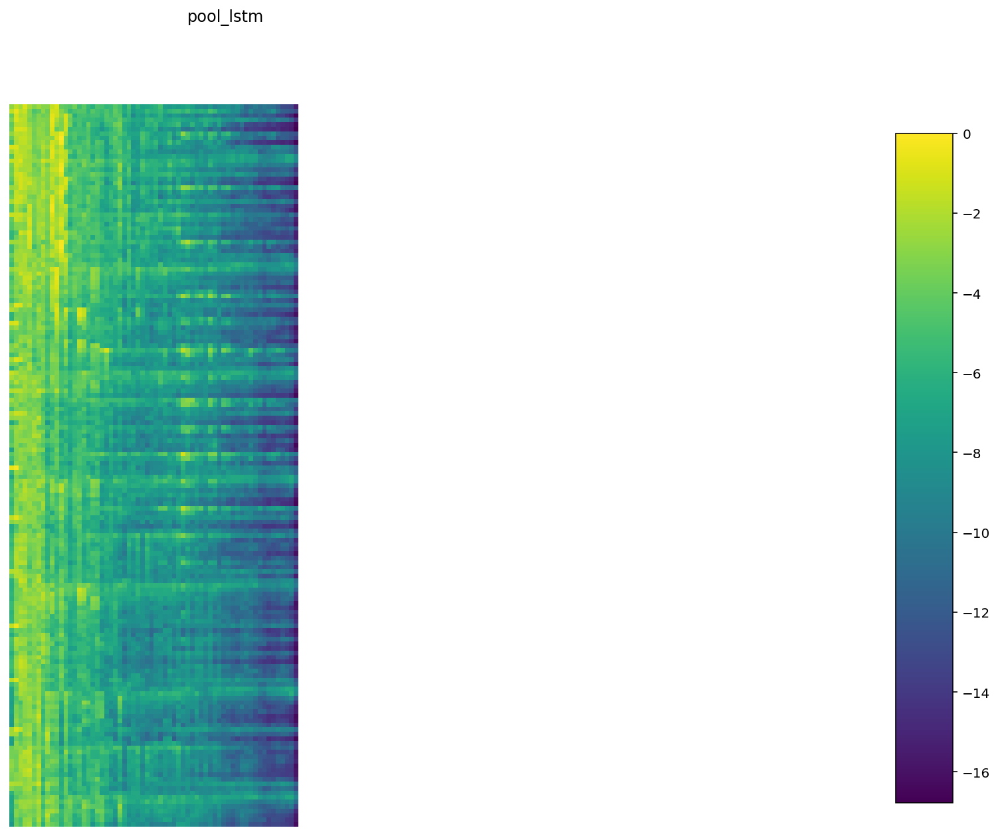

max_pooling2d_9 (1, 4, 1, 64) 


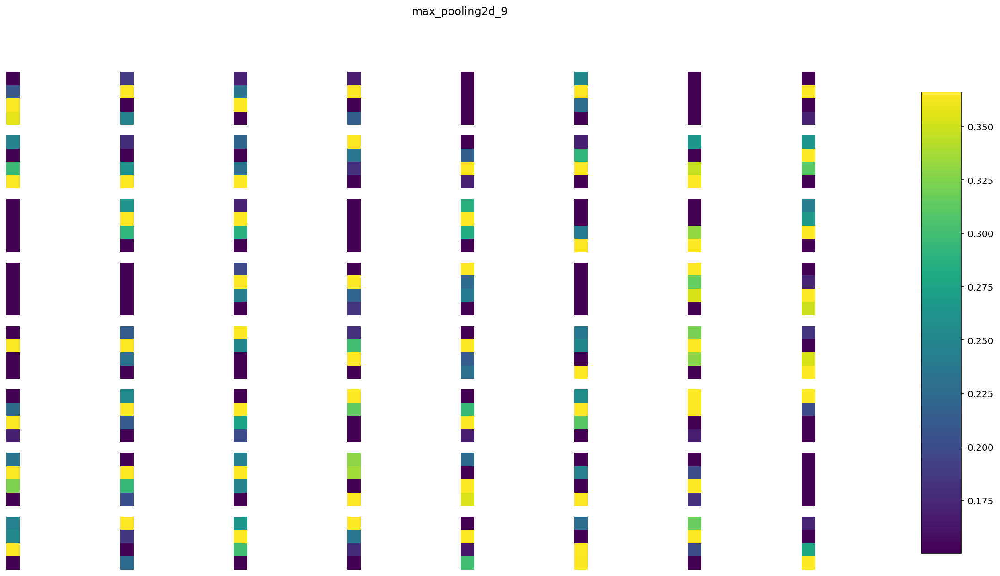

lambda_1 (1, 160, 64) 


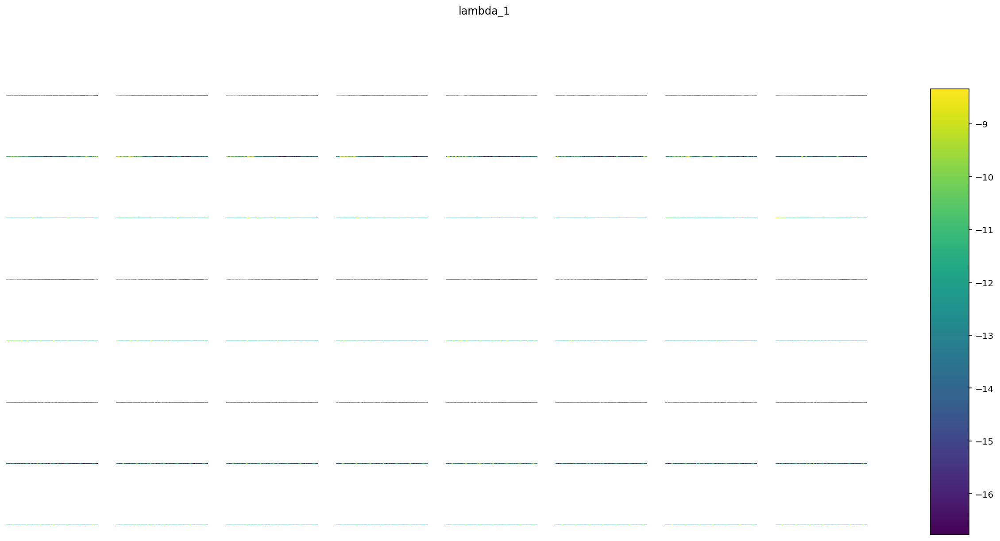

flatten_1 (1, 256) 


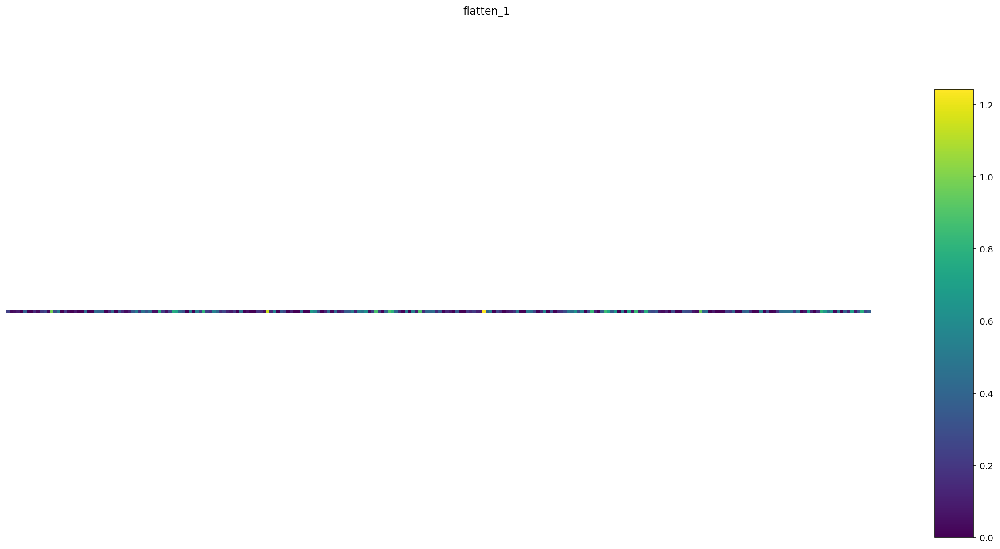

bidirectional_1 (1, 128) 


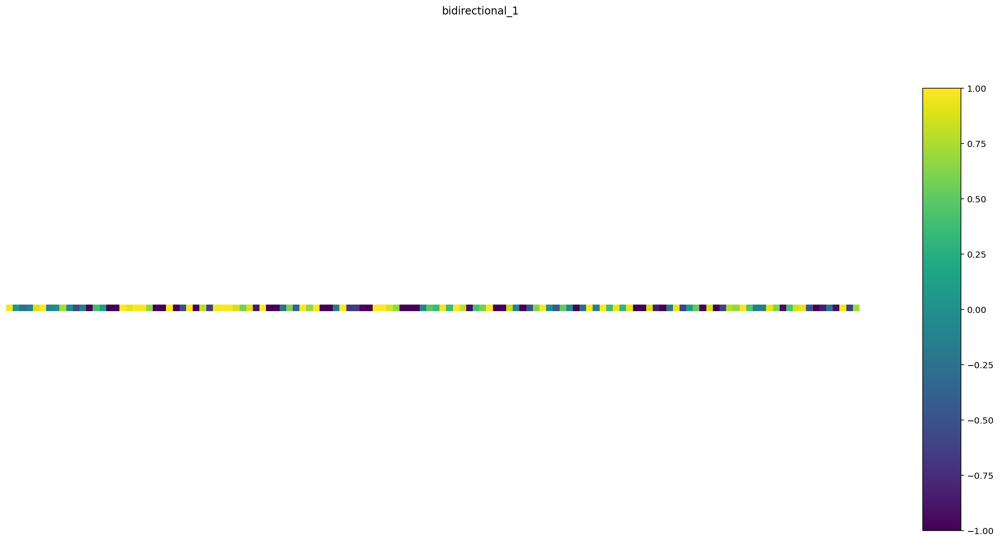

concat (1, 384) 


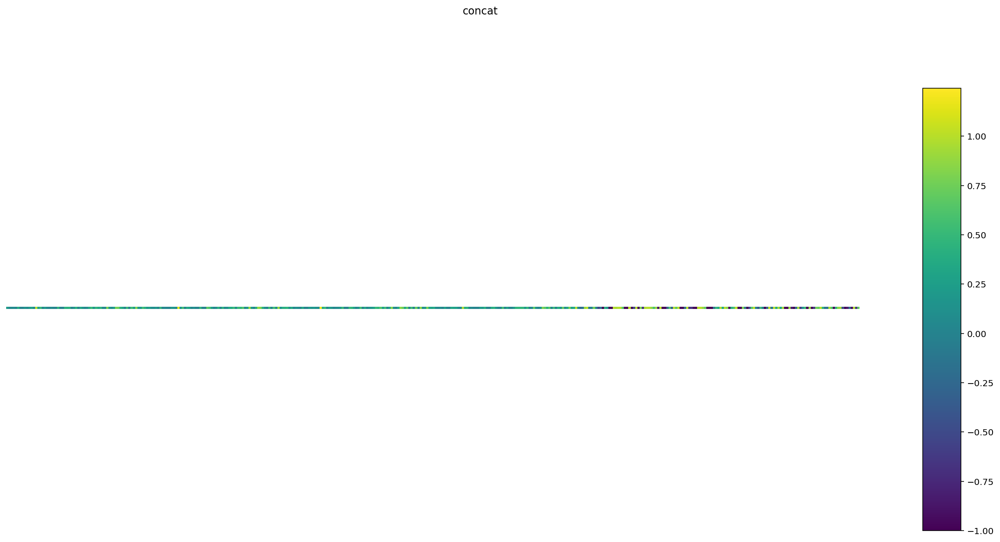

preds (1, 8) 


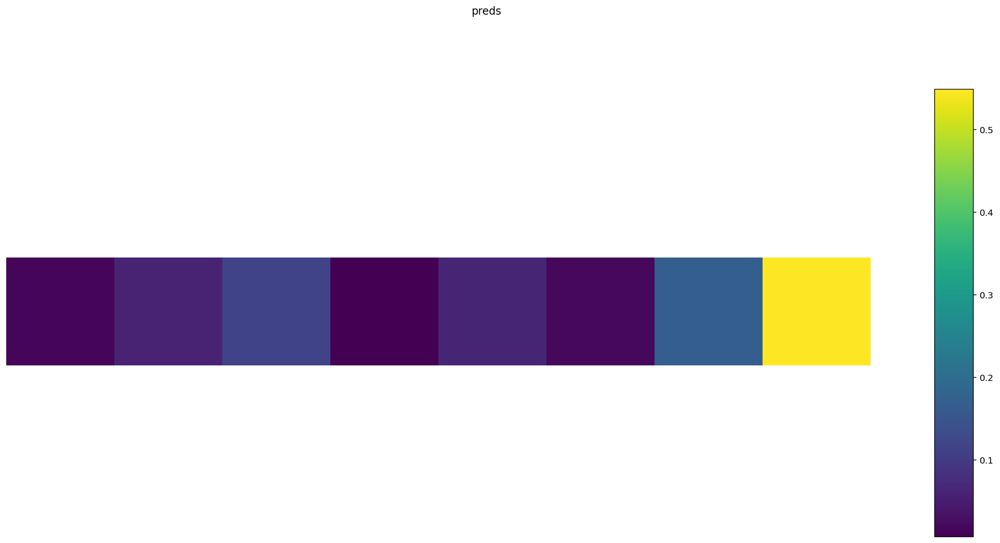

In [ ]:
one_arbitrary_sample = 0
sample = X_valid[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = keract.get_activations(model, sample, layer_names=None, nodes_to_evaluate=None, output_format='simple', nested=False, auto_compile=True)
keract.display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10))

##### Question 13 (10 points)
Visualize the activation layers for the CNN using the code above and try a few samples for each genre. Are there any clear features? Are any of the features similar to the features you expected at the start? Are there similar or different features across genres?

In [ ]:
def plot_activation_genre(genre, layer, num_plots_per_genre):
  num_plot = 0
  for i, x in enumerate(X_valid):
    if reverse_map[np.argmax(y_valid[i])] == genre:
      print(f'#####{genre} Sample Number {num_plot+1}#####\n')
      sample = X_valid[i:i+1]

      activations = keract.get_activations(model, sample, layer_names=layer, nodes_to_evaluate=None, output_format='simple', nested=False, auto_compile=True)
      keract.display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10))

      num_plot += 1
      print('\n\n')
    if num_plot == num_plots_per_genre:
      break

In [ ]:
genres = [k for k,v in dict_genres.items()]

for genre in genres:
  print('########################'+genre+'########################\n')
  plot_activation_genre(genre, None, 2)
  print('\n\n\n')

In [ ]:
layers = ['max_pooling2d_9']

for layer in layers:
  for genre in genres:
    print('########################'+genre+'########################\n')
    plot_activation_genre(genre, layer, 5)
    print('\n\n\n')

**The features that are activated in the data may vary across genres, depending on the unique characteristics of the music in each genre. For example, if pop music tends to have a strong beat and folk music tends to have a more mellow, acoustic sound, we can expect to see different features activated in the activation layers for these two genres.<br><br>When we visualized the activation layers for a CNN, it was difficult to compare the activations across all layers and samples, so we also visualized the activations for a specific layer one after the other, focusing on the last CNN layer before flattening. This helped us identify repetitive patterns and features.<br><br>Overall, we saw similar features across all genres, such as repetitive rectangles that were often clear with strong purple or filled with intense colors. However, when we compared a specific layer between genres, it was still challenging to discern repetitive patterns. This may be due to the low accuracy of the model, which made it harder to recognize these patterns.<br><br>Comparing the activation layers across different genres can be useful for understanding how the network is processing the data and which features it is learning. This can give insights into the characteristics of the music in each genre and how the network is able to distinguish between different genres.**

